# <a id="part-7b"></a>Часть 7b: Прогнозирование активности пользователей на протяжении 1 месяца с помощью Orbit
---
Мы хотим спрогнозировать изменения в активности пользователей на следующий месяц с целью планирования нагрузки на сервере.  
Для этого мы будем использовать пакет Orbit от Uber в качестве инструмента прогнозного анализа.

**Главный вопрос:**
- Какова наиболее вероятная динамика нагрузки (нижняя и верхняя границы) в следующем месяце?

**Вопросы:**
- Какая метрика наилучшим образом описывает нагрузку?
- Какая временная грануляция работает лучше - часовая или дневная?
- Есть ли регрессоры, которые могут улучшить прогноз?
- Какая модель работает лучше всего?

**Шаги:**
- Выберем метрику для прогнозирования, временную грануляцию (дни? часы?), регрессоры.
- Построим модель и проведем ее проверку. Попробуем обратное прогнозирование.   
Для этого попробуем прогнозировать на разные временные масштабы - 1, 2, 3, 4 недели - и изучим метрики ошибок - какой самый длительный временной диапазон, который мы можем предсказать?
- Сравним несколько моделей и выберем лучшую.
- Сделаем выводы.


## Table of Contents

[**Imports, functions, global parameters**](#imports-functions-global-parameters) 

[**1. Choosing the metric and time resolution**](#choosing-metric)  
[1.1. Quering and formatting](#quering-and-formatting)  
[1.2. Finding correlating metrics](#finding-correlating-metrics)  
[1.3. Visualizing time series](#visualizing-time-series)  
[1.4. Choosing hourly active user as a metric](#choosing-hourly-active-user)  
[1.5. Choosing regressors](#choosing-regressors)  

[**2. Forecasting the regressor metric**](#forecasting-the-regressor-metric)  
[2.1.1. Creating sub-regressors](#2.1.1-creating-sub-regressors)  
[2.1.2. Creating transformed metrics](#2.1.2-creating-transformed-metrics)  
[2.1.3. Splitting the dataset](#2.1.3-splitting-the-dataset)  
[2.1.4. Setting arguments for a model](#2.1.4-setting-arguments-for-a-model)  
[2.2. views - no regressors - DLT](#2.2-views-no-regressors-dlt)  
[2.3. log(views) - no regressors - DLT](#2.3-log-views-no-regressors-dlt)  
[2.4. log(views) - with regressor - DLT](#2.4-log-views-with-regressor-dlt)  
[2.5. daily views - with regressor - DLT](#2.5-daily-views-with-regressor-dlt)  
[2.6. log(views) - no regressors - KTR](#2.6-log-views-no-regressors-ktr)  
[2.7. log(views) - with regressor - KTR](#2.7-log-views-with-regressor-ktr)  
[2.8. daily views - with regressor - KTR](#2.8-daily-views-with-regressor-ktr)  
[2.9. Summary](#2.9-summary)  
[2.10. Questions and notes](#section-2.10)  

[**3. Optimizing the regressor forecast**](#3-optimizing-the-regressor-forecast)  
[3.1. Backtest of log views, no regressors, DLT](#3.1-backtest-of-log-views-no-regressors-dlt)  
[3.2. Backtest of log views, no regressors, KTR](#3.2-backtest-of-log-views-no-regressors-ktr)  
[3.3. Backtest of daily views, no regressors, DLT](#3.3-backtest-of-daily-views-no-regressors-dlt)  
[3.4. Backtest of views with regressor, DLT](#3.4-backtest-of-views-with-regressor-dlt)  
[3.5. Choosing metric type and the model for the regressor](#3.5-choosing-metric-type-and-the-model-for-the-regressor)  

[**4. Forecasting target metric**](#4-forecasting-target-metric)  
[4.1. target - no regressors - DLT](#4.1-target-no-regressors-dlt)  
[4.2. log(users) - no regressors - DLT](#4.2-log-users-no-regressors-dlt)  
[4.3. Choosing metric type for the target](#4.3-choosing-metric-type-for-the-target)  
[4.4. log(users) - no regressors - KTR](#4.4-log-users-no-regressors-ktr)  
[4.5. log(users) - pessimistic regressor - KTR](#4.5-log-users-pessimistic-regressor-ktr)  
[4.6. smooth log target - optimistic regressor - KTR](#4.6-smooth-log-target-optimistic-regressor-ktr)  
[4.7. Choosing the model type and regressor type](#4.7-choosing-the-model-type-and-regressor-type)  
[5. Conclusions](#5-conclusions)  
[5.1. Summary of the work and the results](#5.1-summary-of-the-work-and-the-results)  
[5.2. My questions](#5.2-my-questions)  
[5.3. Notes to myself](#5.3-notes-to-myself)  














## Imports, functions, global parameters <a id="imports-functions-global-parameters"></a>


In [1]:
# start with the imports
import os # suppress long orbit outputs
import warnings # suppress matplotlib warnings
import logging

import numpy as np
import pandas as pd
import swifter # applies any function to a pandas df or series faster
import pandahouse as ph # Connect with clickhouse DB

from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import boxcox

import matplotlib
import matplotlib.pyplot as plt # visualization
import seaborn as sns

In [2]:
import orbit #общий пакет
from orbit.models import DLT, KTR #модели
from orbit.diagnostics.plot import plot_predicted_data, plot_predicted_components, plot_bt_predictions #для рисования прогноза
from orbit.diagnostics.backtest import BackTester #основной класс для бэктестинга 
from orbit.utils.params_tuning import grid_search_orbit #для подбора оптимальных параметров

In [3]:
# set the connection with the db
CONNECTION = {'host': 'https://clickhouse.lab.karpov.courses',
                      'database':'simulator_20230720',
                      'user':'student', 
                      'password':'dpo_python_2020'
                     }


In [4]:
# suppress pallette and font-related matplotlib warnings
warnings.filterwarnings('ignore', category=UserWarning)
matplotlib.rcParams['font.family'] = "serif"
matplotlib.rcParams['font.serif'] = "Comic Sans MS"
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
logging.getLogger('orbit').setLevel(logging.ERROR)

In [5]:
# set the default figure quality and size
plt.rcParams['figure.dpi'] = 100 
plt.rcParams['figure.figsize'] = (9, 4)

In [ ]:
# make pandas show less digits for floats
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [7]:
# Create a function that plots a lineplot on a given grid
def lineplotter(
    data: pd.DataFrame,
    x: str,
    y: str,
    ax,
    hue: str = None,
    title: str = None,
    xlabel: str = None,
    ylabel: str = None,
    legend: bool = True
    ) -> None:
    """
    Plots a lineplot for the given dataframe (table) on the given axis (ax)
    """
    fontsize = 15
    labelsize = 12
    
    # Check the label values and infer those not set from the table:
    if not ylabel:
        ylabel = y
    if not xlabel:
        xlabel = x
    if not title:
        title = f"{ylabel} vs {xlabel}"
    
    colormap = sns.color_palette("viridis", as_cmap=True)
    
    # Plot the line plot
    sns.lineplot(
        data=data,
        x=x, 
        y=y, 
        hue=hue,
        ax=ax,
        linewidth=1,
        legend=legend,
        palette=colormap
    )
    
    ax.set_title(title, fontsize=fontsize)
    ax.set_xlabel(xlabel, fontsize=fontsize)
    ax.set_ylabel(ylabel, fontsize=fontsize)
    
    if legend:
        ax.legend(fontsize=fontsize)

    # Set the tick labels
    ax.tick_params(axis='x', rotation=45, labelsize=labelsize)
    ax.tick_params(axis='y', rotation=0, labelsize=labelsize)

In [8]:
# Create a function that plots results of statsmodels'
# seasonsal decompose in a nice manner
def decompose_plotter(decomposed_obj):
    
    fig = decomposed_obj.plot()
    fig.axes[3].lines[0].set(markersize=3);
    fig.set_size_inches((12, 9))
    fig.tight_layout()
    plt.show()

In [9]:
# create a function that extends a dataframe in future
def extend_dataframe(df, 
                     n_days, 
                     fill_value=0,
                     time_column='hour',
                    ):
    '''
    extend given dataframe df in future by n_days
    filling all the columns with fill_value
    '''
    # Calculate the start time for the extended data (last time value in df + 1 hour)
    start_time = df[time_column].iloc[-1] + pd.DateOffset(hours=1)
    
    # Calculate the date range for the next 'n_days' days
    end_date = start_time + pd.DateOffset(days=n_days) - pd.DateOffset(hours=1)
    date_range = pd.date_range(start=start_time, end=end_date, freq='H')

    # Create an extended DataFrame with the specified fill_value in all value columns
    extended_data = {time_column: date_range}
    for col in df.columns:
        if col != time_column:
            extended_data[col] = [fill_value] * len(date_range)
    
    extended_df = pd.DataFrame(extended_data)

    return extended_df


In [10]:
def smooth_value_at_date(df, time_column, value_column, date_to_smooth:str):
    """
    Smooth the values of a specific date in the given DataFrame based on neighboring dates.

    Parameters:
        df (pd.DataFrame): Input DataFrame containing time_column and value_column.
        time_column (str): Name of the time column in the DataFrame.
        value_column (str): Name of the value column in the DataFrame.
        date_to_smooth (pd.Timestamp): Date to be considered for smoothing.

    Returns:
        None: Modifies the input DataFrame by adding a new column with smoothed values.
    """
    # Calculate neighboring dates as -1 and +1 day from the specified date
    date_to_smooth = pd.to_datetime(date_to_smooth)

    previous_date = date_to_smooth - pd.DateOffset(days=1)
    next_date = date_to_smooth + pd.DateOffset(days=1)

    # Create masks for the specified date and the value column to be updated
    mask_next = df[time_column].dt.date == next_date.date()
    mask_previous = df[time_column].dt.date == previous_date.date()
    mask_to_smooth = df[time_column].dt.date == date_to_smooth.date()
    
    df['smooth_' + value_column] = df[value_column]

    # Extract the values for the previous and next dates
    values_previous = df[mask_previous][value_column]
    values_next = df[mask_next][value_column]

    # Reset the indexes of the Series
    values_previous_reset = values_previous.reset_index(drop=True)
    values_next_reset = values_next.reset_index(drop=True)

    # Calculate the average of the reset Series
    average_series = (values_previous_reset + values_next_reset) / 2

    # Set the index of the average_series to match the index of the original DataFrame for the date to smooth
    average_series.index = df[mask_to_smooth].index

    # Add a new column to the original DataFrame with the averaged Series values for the specified date
    df.loc[df[mask_to_smooth].index, 'smooth_' + value_column] = average_series

## <a id="choosing-metric"></a> 1. Choosing the metric and time resolution

В модуле 7a мы уже рассмотрели основные метрики продукта. Давайте взглянем на них снова, но немного изменим метрики, связанные с числом пользователей:
  - просмотры, 
  - лайки, 
  - CTR (Click-Through Rate), 
  - созданные посты, 
  - уникальные просмотренные посты, 
  - просмотры на один уникальный просмотренный пост, 
  - лайки на уникальный просмотренный пост,
  - общее число активных пользователей, 
  - новые активные пользователи (день активности выпадает на неделю первой активности),
  - удерживаемые активные пользователи (активные как на этой, так и на предыдущей неделе).
  
Затем мы сможем решить, на какой метрике мы остановимся.  
Давайте рассмотрим часовое разрешение (как в модуле 7a) и дневное разрешение.


### <a id="quering-and-formatting"></a>1.1. Quering and formatting


In [11]:
# get a table with the acitivty metrics
# for the whole period of the product
# grouped by hour

start_date = '2023-06-04'
query = f'''
-- CTE to get unique pairs user-hour and store user's first active week
-- as well as all of their activity weeks
WITH hours_labeled AS (
    SELECT 
        user_id, 
        hour,
        start_week,
        if(has(all_weeks, date_sub(WEEK, 1, toStartOfWeek(hour))), 1, 0) AS is_previous_week
    FROM (
        SELECT DISTINCT 
            user_id, 
            toStartOfHour(time) AS hour, 
            groupUniqArray(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS all_weeks,
            min(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS start_week
        FROM simulator_20230720.feed_actions
    ) t1
)

-- CTE to count total, new and retained active users for each hour
, counts_per_hour AS (
    SELECT 
        hour, 
        countIf(toStartOfWeek(hour) = start_week) AS new_users,
        countIf(is_previous_week = 1) AS retained_users,
        count(user_id) AS active_users
    FROM hours_labeled
    GROUP BY hour
)

-- CTE with hourly acitivity metrics
, hourly_metrics AS (
    SELECT
        hour,
        countIf(action = 'view') AS views,
        countIf(action = 'like') AS likes,
        countDistinct(post_id) AS unique_posts,
        countIfDistinctOrNull(post_id, hour = toStartOfHour(created_date)) AS created_posts
        
    FROM
        (SELECT
        toStartOfHour(time) AS hour,
        action,
        post_id,
        min(time) OVER (PARTITION BY post_id) AS created_date
        FROM simulator_20230720.feed_actions) feed_actions_post_creation_date
    WHERE hour BETWEEN '{start_date}'::DATE AND '2023-08-12'::DATE
    GROUP BY hour
)

-- Final query to retrieve total, new, retained active user counts for each hour
-- as well as views, likes, and other hourly metrics

SELECT 
    hour,
    views,
    likes,
    likes / views as ctr,
    unique_posts,
    created_posts,
    views / unique_posts AS views_per_unique_post,
    likes / unique_posts AS likes_per_unique_post,
    active_users,
    new_users,
    retained_users
    
FROM counts_per_hour

JOIN hourly_metrics ON counts_per_hour.hour = hourly_metrics.hour

ORDER BY hour ASC
'''

# import a table to a dataframe
activity_metrics_hour = ph.read_clickhouse(
    query, 
    connection=CONNECTION
)


In [12]:
activity_metrics_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1657 entries, 0 to 1656
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   hour                   1657 non-null   datetime64[ns]
 1   views                  1657 non-null   uint64        
 2   likes                  1657 non-null   uint64        
 3   ctr                    1657 non-null   float64       
 4   unique_posts           1657 non-null   uint64        
 5   created_posts          1657 non-null   uint64        
 6   views_per_unique_post  1657 non-null   float64       
 7   likes_per_unique_post  1657 non-null   float64       
 8   active_users           1657 non-null   uint64        
 9   new_users              1657 non-null   uint64        
 10  retained_users         1657 non-null   uint64        
dtypes: datetime64[ns](1), float64(3), uint64(7)
memory usage: 142.5 KB


In [13]:
activity_metrics_hour.tail()

,hour,views,likes,ctr,unique_posts,created_posts,views_per_unique_post,likes_per_unique_post,active_users,new_users,retained_users
1652,2023-08-11 20:00:00,35281,7027,0.199,120,6,294.008,58.558,2215,336,1414
1653,2023-08-11 21:00:00,35896,7096,0.198,135,15,265.896,52.563,2018,280,1288
1654,2023-08-11 22:00:00,34214,6749,0.197,136,7,251.574,49.625,1836,264,1141
1655,2023-08-11 23:00:00,30708,6086,0.198,137,1,224.146,44.423,1598,232,1011
1656,2023-08-12 00:00:00,24683,5288,0.214,135,1,182.837,39.170,1324,239,803


получим тот же набор данных с разрешением по дням.

In [14]:
# get a table with the acitivty metrics
# for the whole period of the product
# grouped by day

start_date = '2023-06-04'
query = f'''
-- CTE to get unique pairs user-day and store user's first active week
-- as well as all of their activity weeks
WITH days_labeled AS (
    SELECT 
        user_id, 
        day,
        start_week,
        if(has(all_weeks, date_sub(WEEK, 1, toStartOfWeek(day))), 1, 0) AS is_previous_week
    FROM (
        SELECT DISTINCT 
            user_id, 
            toDate(time) AS day, 
            groupUniqArray(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS all_weeks,
            min(toStartOfWeek(time)) OVER (PARTITION BY user_id) AS start_week
        FROM simulator_20230720.feed_actions
    ) t1
)

-- CTE to count total, new and retained active users for each day
, counts_per_day AS (
    SELECT 
        day, 
        countIf(toStartOfWeek(day) = start_week) AS new_users,
        countIf(is_previous_week = 1) AS retained_users,
        count(user_id) AS active_users
    FROM days_labeled
    GROUP BY day
)

-- CTE with daily acitivity metrics
, daily_metrics AS (
    SELECT
        day,
        countIf(action = 'view') AS views,
        countIf(action = 'like') AS likes,
        countDistinct(post_id) AS unique_posts,
        countIfDistinctOrNull(post_id, day = toStartOfDay(created_date)) AS created_posts
        
    FROM
        (SELECT
        toStartOfDay(time) AS day,
        action,
        post_id,
        min(time) OVER (PARTITION BY post_id) AS created_date
        FROM simulator_20230720.feed_actions) feed_actions_post_creation_date
    WHERE day BETWEEN '{start_date}'::DATE AND '2023-08-12'::DATE
    GROUP BY day
)

-- Final query to retrieve total, new, retained active user counts for each day
-- as well as views, likes, and other daily metrics

SELECT 
    day,
    views,
    likes,
    likes / views as ctr,
    unique_posts,
    created_posts,
    views / unique_posts AS views_per_unique_post,
    likes / unique_posts AS likes_per_unique_post,
    active_users,
    new_users,
    retained_users
    
    
FROM counts_per_day

JOIN daily_metrics ON counts_per_day.day = daily_metrics.day

ORDER BY day ASC
'''

# import a table to a dataframe
activity_metrics_day = ph.read_clickhouse(
    query, 
    connection=CONNECTION
)


In [15]:
activity_metrics_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   day                    70 non-null     datetime64[ns]
 1   views                  70 non-null     uint64        
 2   likes                  70 non-null     uint64        
 3   ctr                    70 non-null     float64       
 4   unique_posts           70 non-null     uint64        
 5   created_posts          70 non-null     uint64        
 6   views_per_unique_post  70 non-null     float64       
 7   likes_per_unique_post  70 non-null     float64       
 8   active_users           70 non-null     uint64        
 9   new_users              70 non-null     uint64        
 10  retained_users         70 non-null     uint64        
dtypes: datetime64[ns](1), float64(3), uint64(7)
memory usage: 6.1 KB


In [16]:
activity_metrics_day.tail()

,day,views,likes,ctr,unique_posts,created_posts,views_per_unique_post,likes_per_unique_post,active_users,new_users,retained_users
65,2023-08-08,719064,147718,0.205,213,81,3375.887,693.512,19363,2172,12989
66,2023-08-09,727028,151312,0.208,201,49,3617.055,752.796,19466,2569,12702
67,2023-08-10,648856,140093,0.216,216,92,3003.963,648.579,18995,2656,12111
68,2023-08-11,720009,149313,0.207,202,54,3564.401,739.173,18646,2694,11736
69,2023-08-12,617308,130743,0.212,183,49,3373.268,714.443,18755,3109,11540


### <a id="finding-correlating-metrics"></a>1.2. Finding correlating metrics

'Посмотрим на коэффициенты корреляции для часовых метрик: есть ли какие-либо коррелирующие метрики?'

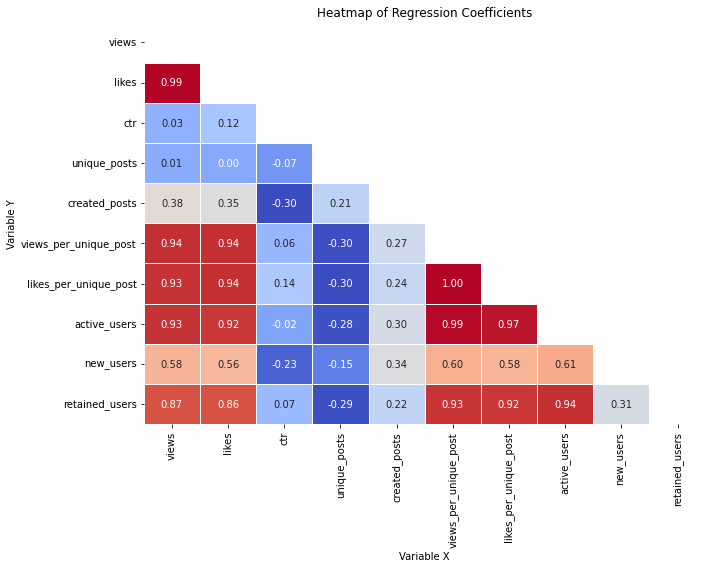

In [17]:
regression_coefficients = activity_metrics_hour.query("hour < '2023-07-14'").drop(['hour'], axis=1).corr()

# Create a heatmap of the regression coefficients
plt.figure(figsize=(10, 8))

# Create a mask to hide the upper triangle elements
mask = np.triu(m=np.ones_like(regression_coefficients, dtype=bool))

sns.heatmap(regression_coefficients, annot=True, cbar=False, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Heatmap of Regression Coefficients')
plt.xlabel('Variable X')
plt.ylabel('Variable Y')
plt.tight_layout()
plt.show()

По Спирмену?

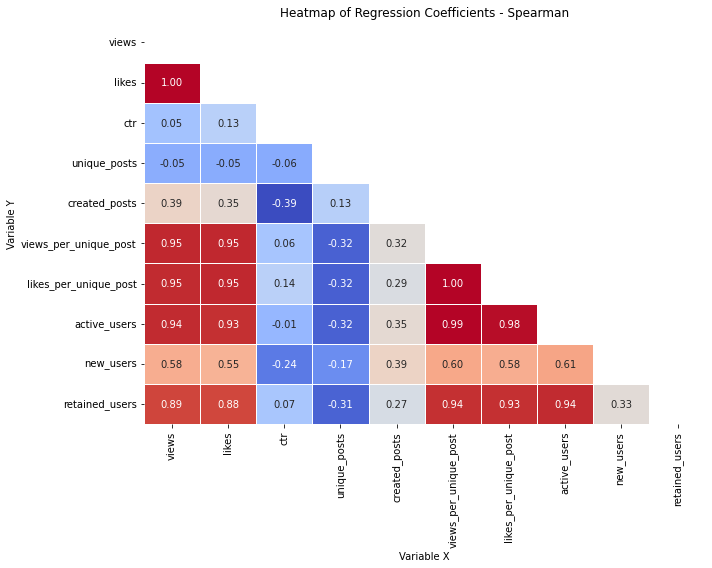

In [18]:
regression_coefficients = activity_metrics_hour.query(
    "hour < '2023-07-14'").drop(['hour'], axis=1).corr(method="spearman")

# Create a heatmap of the regression coefficients
plt.figure(figsize=(10, 8))

# Create a mask to hide the upper triangle elements
mask = np.triu(m=np.ones_like(regression_coefficients, dtype=bool))

sns.heatmap(regression_coefficients, annot=True, cbar=False, cmap='coolwarm', fmt='.2f', linewidths=0.5, mask=mask)
plt.title('Heatmap of Regression Coefficients - Spearman')
plt.xlabel('Variable X')
plt.ylabel('Variable Y')
plt.tight_layout()
plt.show()

И матрица с рассеянием

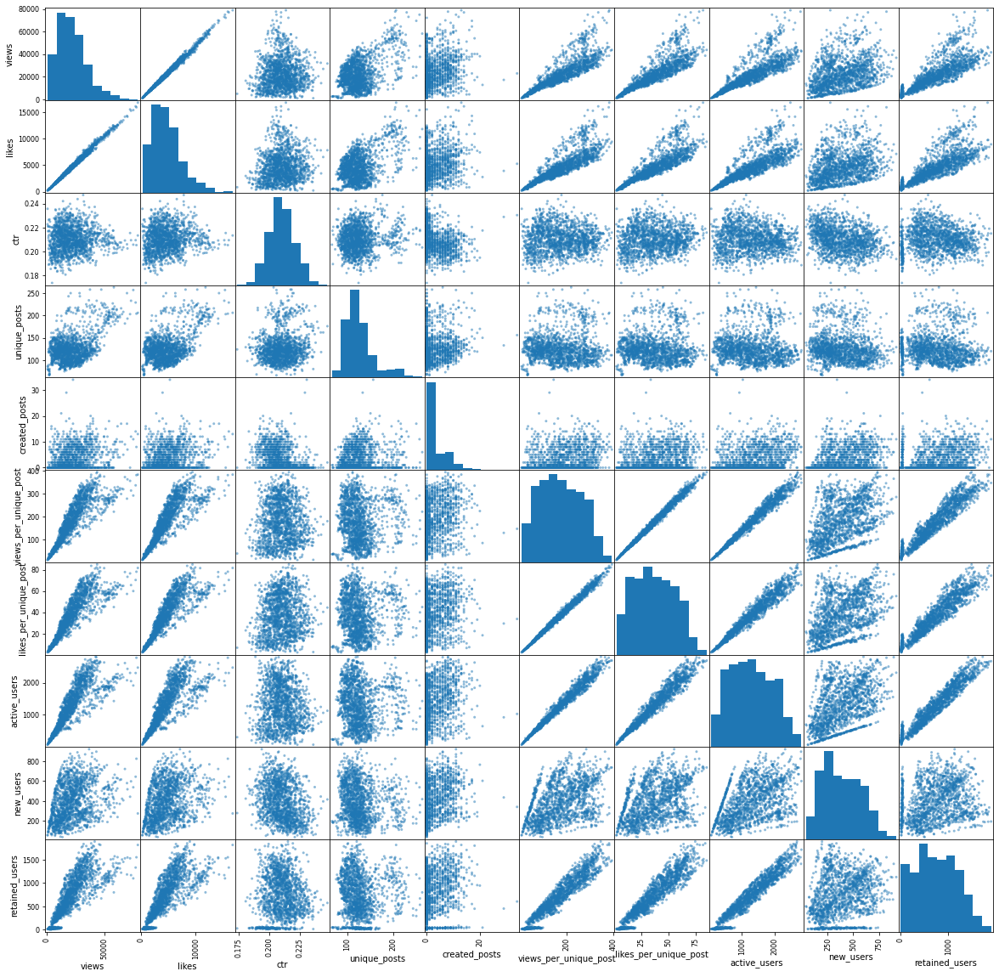

In [19]:
matrix = pd.plotting.scatter_matrix(activity_metrics_hour.iloc[1:], figsize=(20, 20))

"Теперь посмотрите на графики временных рядов и на основе как графиков, так и данных о корреляции, выберем метрики регрессоров.

### <a id="visualizing-time-series"></a>1.3. Visualizing time series


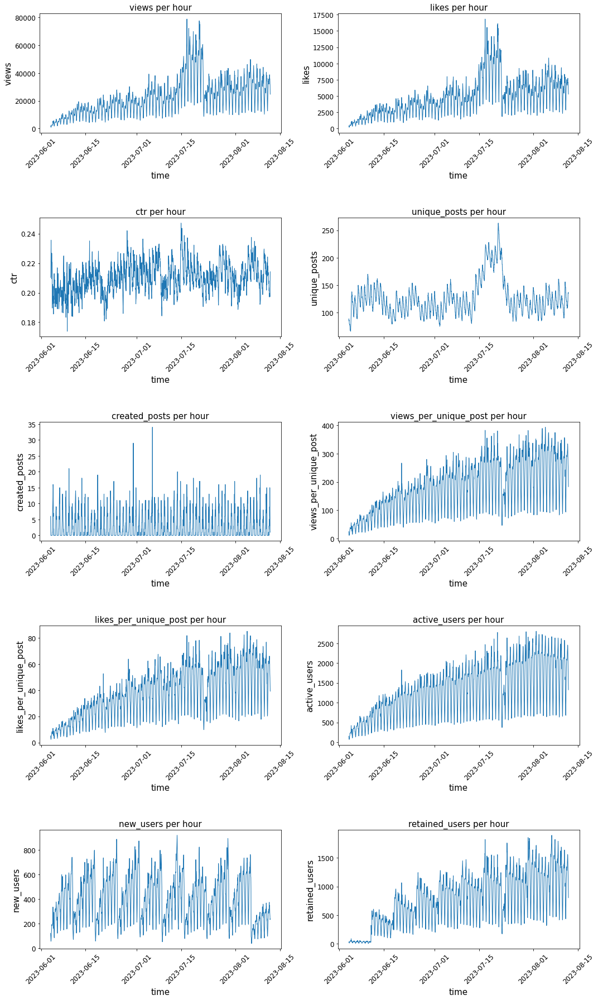

In [20]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(15, 25))
for series, ax in zip(list(activity_metrics_hour)[1:], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_hour,
        x='hour',
        y=series,
        ax=ax,
        title=f'{series} per hour',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


'Давайте посмотрим на те же метрики, но с разрешением по дням.'

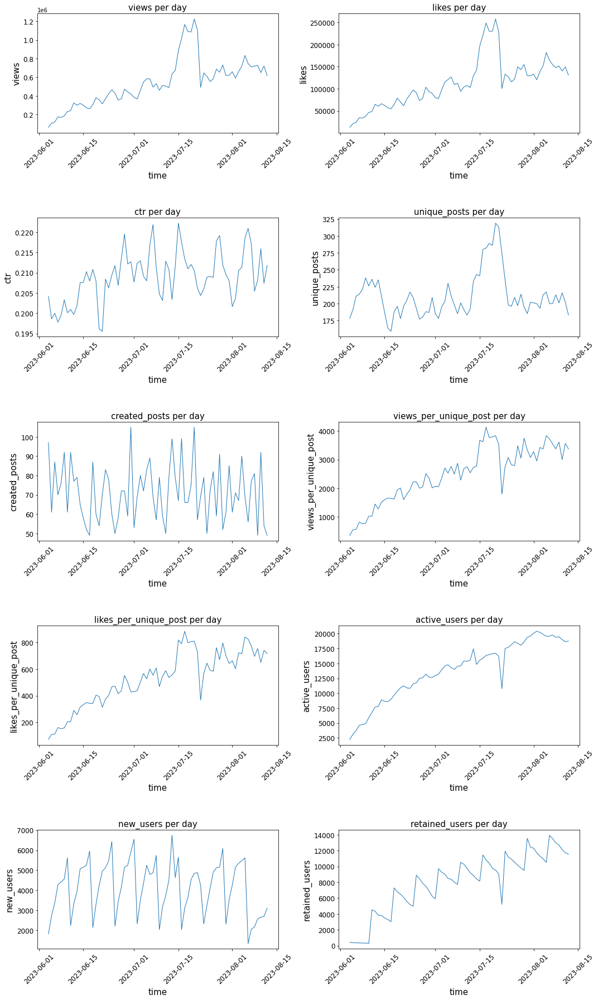

In [21]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(15, 25))
for series, ax in zip(list(activity_metrics_day)[1:], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_day,
        x='day',
        y=series,
        ax=ax,
        title=f'{series} per day',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


### <a id="choosing-hourly-active-user"></a>  1.4. Choosing hourly active user as a metric

Среди всех метрик давайте выберем метрики для уникальных пользователей: общее число, новые, удержанные:
1. В основном они не имеют крупных скачков в значении (за исключением падения 21-22 июля), что является хорошим показателем их стабильности.   
В отличие от этого, просмотры и лайки были сильно затронуты недавней кампанией в конце июля.   
Несмотря на то что это был краткосрочный эффект, он не представляет основного состояния метрики и может негативно повлиять на прогноз.
2. Они растут со временем с более или менее заметным трендом, в отличие от CTR (который может иметь небольшой рост) и уникальных и созданных постов (которые, кажется, не растут).
3. Наконец, они действительно представляют активность пользователей, которая может быть интерпретирована как нагрузка на сервер.   
В то время как просмотры и лайки на уникальный пост следуют схожим трендам, они скорее показывают "качество" постов, а не нагрузку на ленту (например, у нас может быть одинаковое количество пользователей, но разная скорость просмотра и лайков).

'Давайте рассмотрим эти три метрики по часам и проведем декомпозицию.'

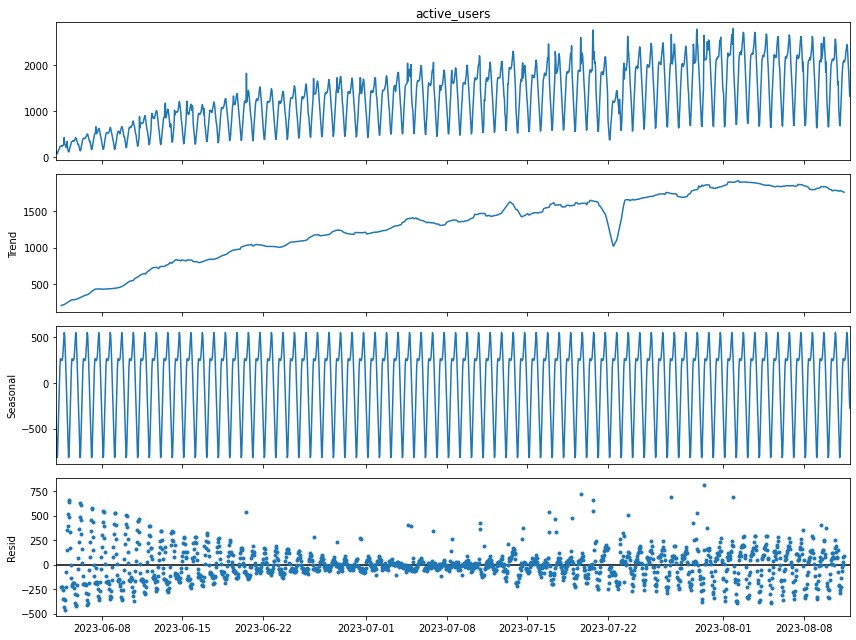

In [22]:
active_users_decomposed = seasonal_decompose(activity_metrics_hour.set_index('hour').active_users)

decompose_plotter(active_users_decomposed)

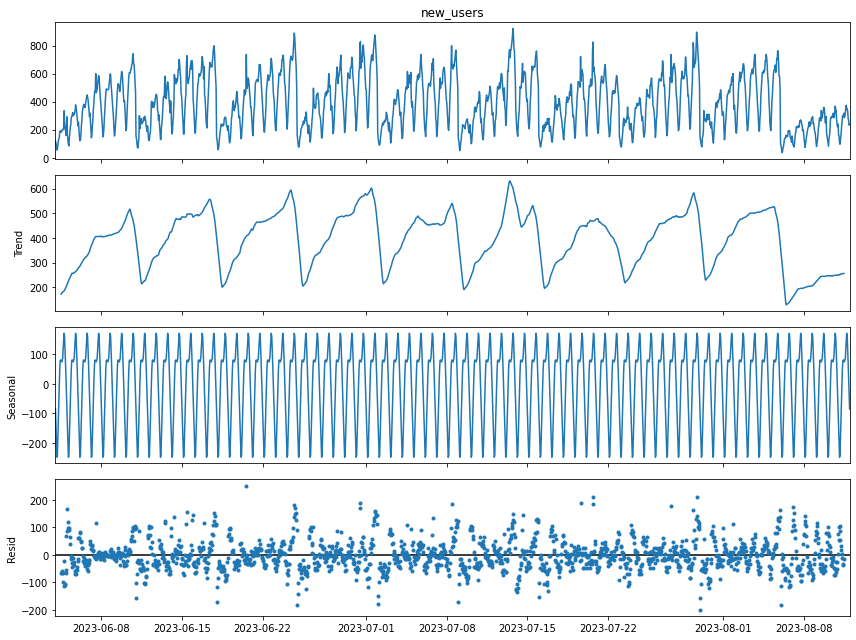

In [23]:
new_users_decomposed = seasonal_decompose(activity_metrics_hour.set_index('hour').new_users)

decompose_plotter(new_users_decomposed)

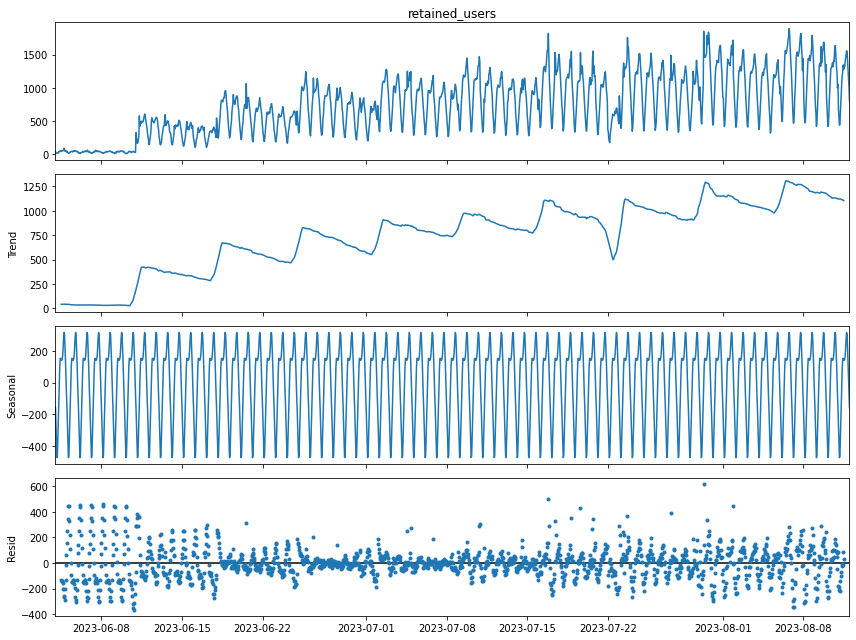

In [24]:
retained_users_decomposed = seasonal_decompose(activity_metrics_hour.set_index('hour').retained_users)

decompose_plotter(retained_users_decomposed)

Какой из трех выбрать: суммарные, новые или удержанные активные пользователи?  
Общее число включает информацию об обеих группах: новых и удержанных. Обычно первая группа является источником наших будущих удержанных пользователей, тогда как удержанные пользователи обычно обладают более высоким качеством.  
Так что мы выберем общее число активных пользователей.  
Что касается временного разрешения, давайте рассмотрим и часовое, и дневное разрешение: так как у нас есть пики активности и неактивности, определенные с часовым разрешением, это может быть важно при будущем прогнозировании, чтобы оценивать не только средние, но и пиковые рабочие нагрузки. Ежедневные метрики менее шумны и могут иметь разное поведение в прогнозировании, что может быть полезно для нас.

### 1.5. <a id="choosing-regressors"></a>Choosing regressors

Какие регрессоры мы выберем, если вообще будем использовать?

Возможные варианты:
- Бинарные регрессоры (последовательности из 0 и 1):
    - Аномальные дни: кампании, тесты, сбои приложения и т. д.

- Прогнозируемые метрики:
    - Просмотры на уникальный пост - это лучшее коррелирующее значение. Для прогнозирования этой метрики используем регрессор с учетом кампании как регрессора - 13-21 июля (повышение просмотров)

Падение 22 июля мы "сгладим" усреднением двух соседних дней

Когда именно было падение 22 июля?

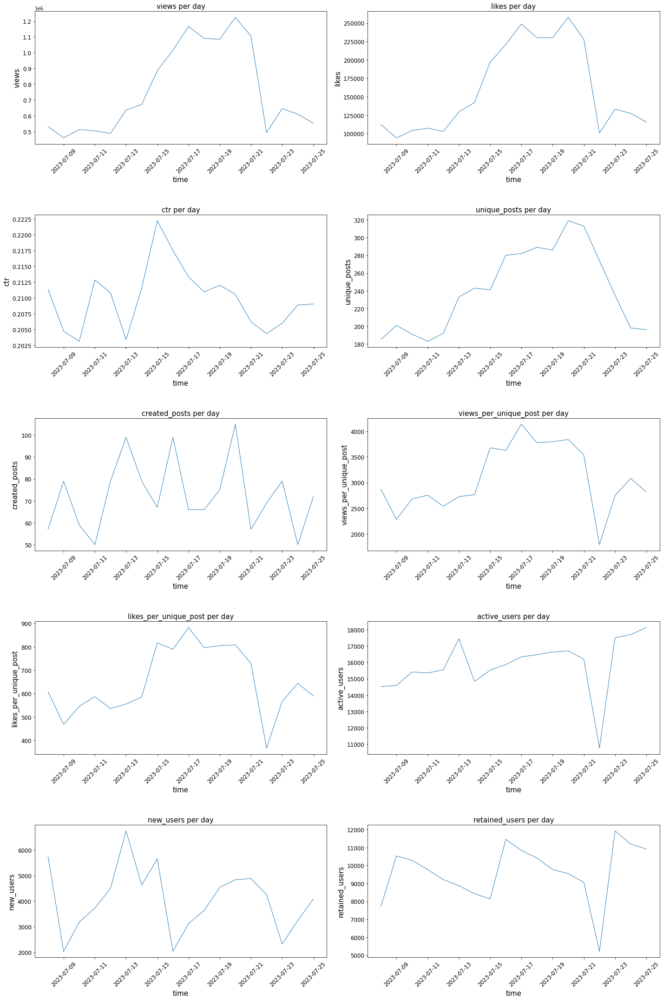

In [25]:
# make a canvas, set sizes
fig, axs = plt.subplots(5, 2, figsize=(20, 30))
for series, ax in zip(list(activity_metrics_day)[1:], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_day.loc[activity_metrics_day.day.between('2023-07-08', '2023-07-25')],
        x='day',
        y=series,
        ax=ax,
        title=f'{series} per day',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


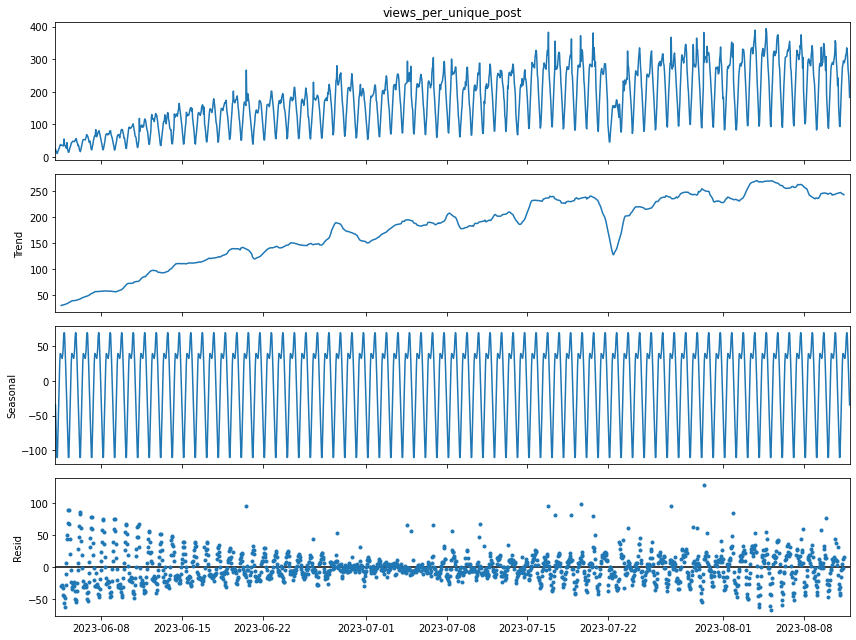

In [26]:
views_decomposed = seasonal_decompose(activity_metrics_hour.set_index('hour').views_per_unique_post)

decompose_plotter(views_decomposed)

"Так как наши данные, кажется, также имеют недельную сезонность, давайте также проведем декомпозицию по дневным просмотрам."

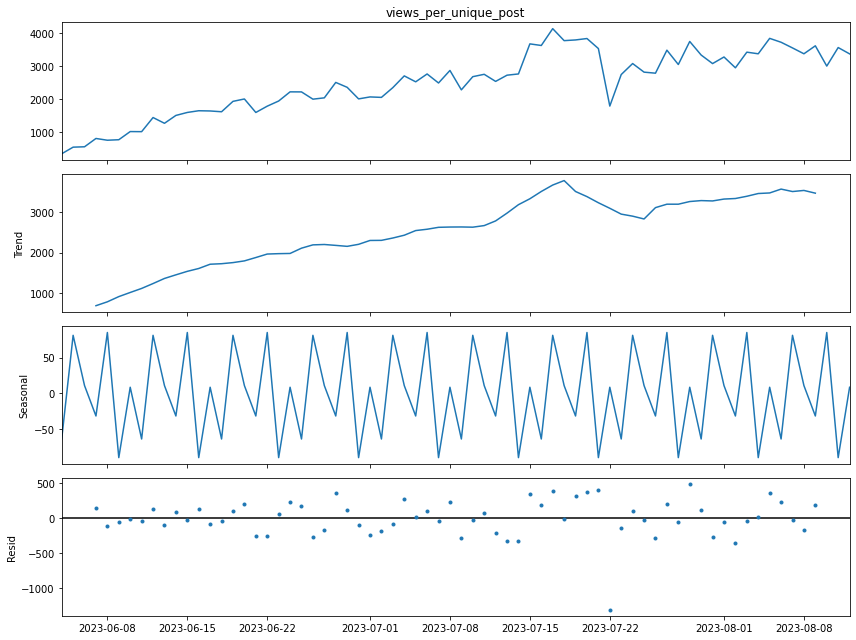

In [27]:
views_decomposed = seasonal_decompose(activity_metrics_day.set_index('day').views_per_unique_post, period=7)

decompose_plotter(views_decomposed)

Похоже, что падение было именно 22 июля, весь день, и не затронуло соседние дни.

## <a id="forecasting-the-regressor-metric"></a>2. Forecasting the regressor metric
---
Теперь мы прогнозируем метрику - просмотры на один уникальный пост с использованием/без использования бинарного регрессора и проверим модель.
В конце у нас должно быть два прогноза: пессимистический (с недооценкой просмотров) и оптимистический (с переоценкой просмотров).


First, drop the columns we don't need in our dataframe

In [28]:
to_drop = [
         'views',
         'likes',
         'ctr',
         'unique_posts',
         'created_posts',
         'likes_per_unique_post',
        'new_users',
        'retained_users'
]

activity_metrics_hour.drop(to_drop, axis=1, inplace=True)

### 2.1.1 Creating sub-regressors<a id="2.1.1-creating-sub-regressors"></a>


Let's make column for a sub-regressor: campaign-caused jump on 14-21 july.

In [29]:
start_date_jump = pd.Timestamp('2023-07-13')
end_date_jump = pd.Timestamp('2023-07-21')

# Add 'jump_campaign' column
activity_metrics_hour['jump_campaign'] = (
    (activity_metrics_hour['hour'] >= start_date_jump) & 
    (activity_metrics_hour['hour'] <= end_date_jump)
).astype(int)

# same for daily metric
activity_metrics_day['jump_campaign'] = (
    (activity_metrics_day['day'] >= start_date_jump) & 
    (activity_metrics_day['day'] <= end_date_jump)
).astype(int)

### 2.1.2 Creating transformed metrics<a id="2.1.2-creating-transformed-metrics"></a>


For views and active users, make z-scored and log derivatives as well as box-cox transformed one

In [30]:
metrics = [
    'views_per_unique_post',
    'active_users'
]

dataframes = [
    activity_metrics_hour,
    activity_metrics_day
]

time_columns = [
    'hour',
    'day'
]

for metric in metrics:
    for df, time_column in zip(dataframes, time_columns):
        # Calculate mean and standard deviation
        mean = df[metric].mean()
        std = df[metric].std()
        
        # make a column with z-scores
        df['z_scored_' + metric] = df[metric].sub(mean).div(std)
        
        # make a log column
        df['log_' + metric] = np.log(df[metric])
        
        # make a column with box-cox transformation
        transformed_data, lambda_value = boxcox(df[metric])
        df['boxcox_' + metric] = transformed_data
        df['boxcox_lambda_for_' + metric] = lambda_value       
        
        # make a column with smoothened 22 july values
        smooth_value_at_date(df=df,
                     time_column=time_column, 
                     value_column='log_'+metric, 
                     date_to_smooth='2023-07-22'
                    )
        
        smooth_value_at_date(df=df,
                     time_column=time_column, 
                     value_column='z_scored_'+metric, 
                     date_to_smooth='2023-07-22'
                    )
        

In [31]:
activity_metrics_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1657 entries, 0 to 1656
Data columns (total 16 columns):
 #   Column                                   Non-Null Count  Dtype         
---  ------                                   --------------  -----         
 0   hour                                     1657 non-null   datetime64[ns]
 1   views_per_unique_post                    1657 non-null   float64       
 2   active_users                             1657 non-null   uint64        
 3   jump_campaign                            1657 non-null   int64         
 4   z_scored_views_per_unique_post           1657 non-null   float64       
 5   log_views_per_unique_post                1657 non-null   float64       
 6   boxcox_views_per_unique_post             1657 non-null   float64       
 7   boxcox_lambda_for_views_per_unique_post  1657 non-null   float64       
 8   smooth_log_views_per_unique_post         1657 non-null   float64       
 9   smooth_z_scored_views_per_unique_post    

How does log metric behave in time? how does it correlate with active_users target metric?

In [32]:
activity_metrics_hour.query("hour < '2023-07-14'")[[
    'log_views_per_unique_post', \
    'views_per_unique_post', 
    'active_users', 
    'log_active_users',
    'boxcox_views_per_unique_post']].corr()

,log_views_per_unique_post,views_per_unique_post,active_users,log_active_users,boxcox_views_per_unique_post
log_views_per_unique_post,1.000,0.947,0.942,0.994,0.973
views_per_unique_post,0.947,1.000,0.988,0.937,0.995
active_users,0.942,0.988,1.000,0.947,0.985
log_active_users,0.994,0.937,0.947,1.000,0.964
boxcox_views_per_unique_post,0.973,0.995,0.985,0.964,1.000


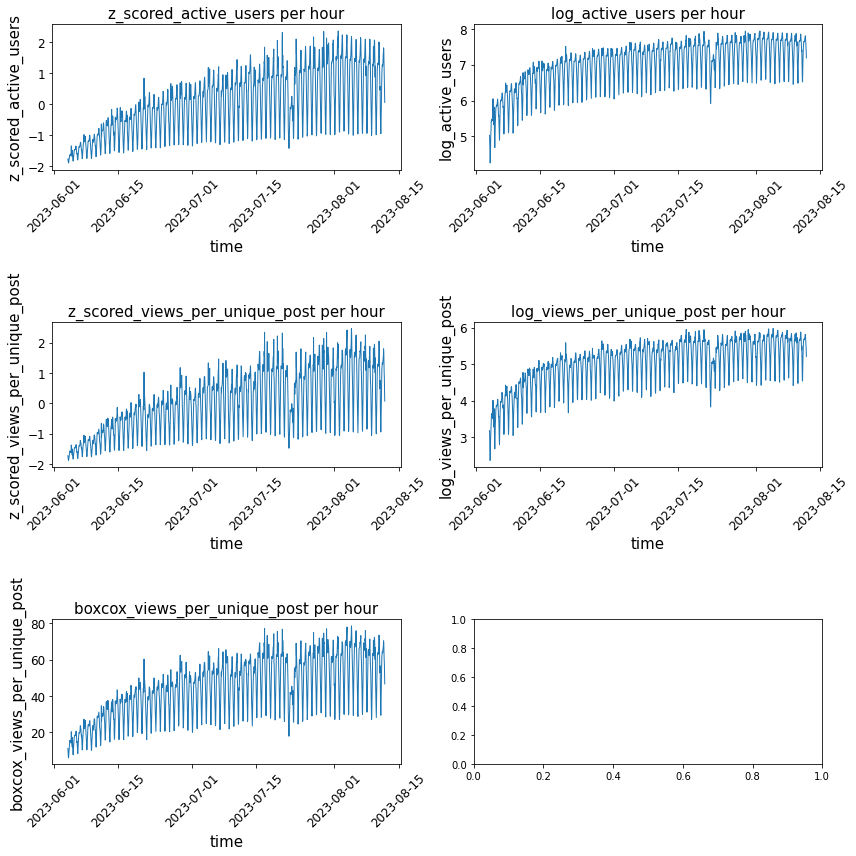

In [33]:
# make a canvas, set sizes
fig, axs = plt.subplots(3, 2, figsize=(12, 12))
for series, ax in zip(['z_scored_active_users',
                       'log_active_users',
                       'z_scored_views_per_unique_post', 
                       'log_views_per_unique_post',
                       'boxcox_views_per_unique_post'
                      ], axs.reshape(-1)):

    lineplotter(
        data=activity_metrics_hour,
        x='hour',
        y=series,
        ax=ax,
        title=f'{series} per hour',
        xlabel='time',
        ylabel=f'{series}',
        legend=False
        )

plt.tight_layout(h_pad=5)


boxcox не имеет большой разницы по сравнению с исходными просмотрами - также нестационарно с увеличивающейся дисперсией.  
Однако логарифмирование просмотров, напротив, помогает уменьшить амплитуду, сохраняя при этом исходный тренд.  
Давайте сосредоточимся на z-стандартизированных просмотрах (это преобразование иногда может помочь в прогнозировании) и на логарифме. Попробуем добавить сглаживание, заменив выбивающиеся значения 22 июля средними значениями 21 и 23 июля.   
Мы не будем рассматривать просмотры без преобразования и рассмотрим только сглажженые метрики.  
Начнем с модели DLT.

### 2.1.3 Splitting the dataset<a id="2.1.3-splitting-the-dataset"></a>

Let's have the last 14 days of the time-series as a testing part. Later on, we will try to increase forecasting window.

In [34]:
# first, separate our df into train and split parts
n_days = 14
test_size=24 * n_days

train_df=activity_metrics_hour[:-test_size]
test_df=activity_metrics_hour[-test_size:]

### 2.1.4 Setting arguments for a model<a id="2.1.4-setting-arguments-for-a-model"></a>


Let's set parameters for models with hourly metrics

In [35]:
date_col = 'hour'
seasonality = 24
regressor_col = ['jump_campaign']

### 2.2. views - no regressors - DLT<a id="2.2-views-no-regressors-dlt"></a>


In [36]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_views_per_unique_post'

In [37]:
# initialize a model
z_views_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
z_views_dlt.fit(train_df)
predicted_df = z_views_dlt.predict(df=activity_metrics_hour, decompose=True)

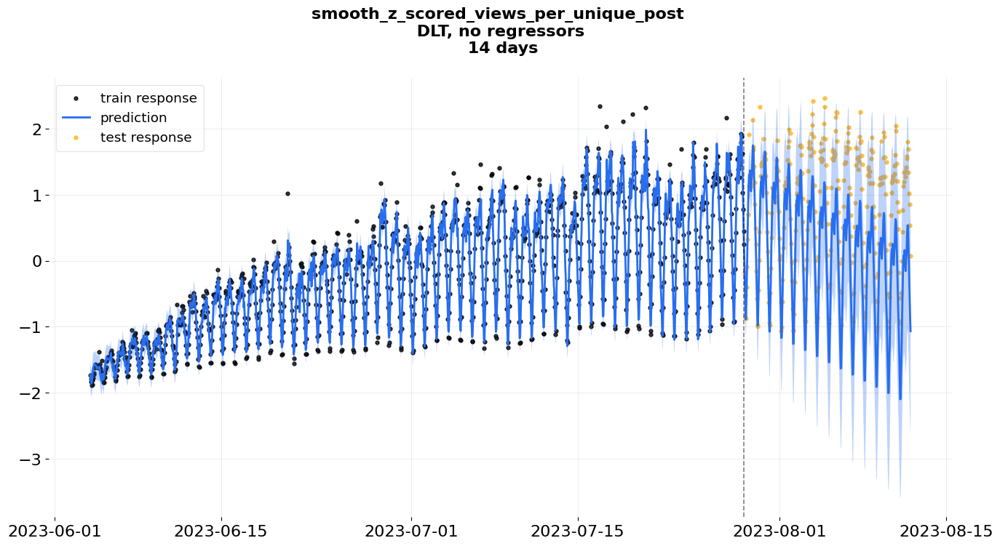

In [38]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

The trend is quite negative. What about log metric?

### 2.3. log(views) - no regressors - DLT<a id="2.3-log-views-no-regressors-dlt"></a>


In [39]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [40]:
# initialize a model
log_views_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
log_views_dlt.fit(train_df)
predicted_df = log_views_dlt.predict(df=activity_metrics_hour, decompose=True)

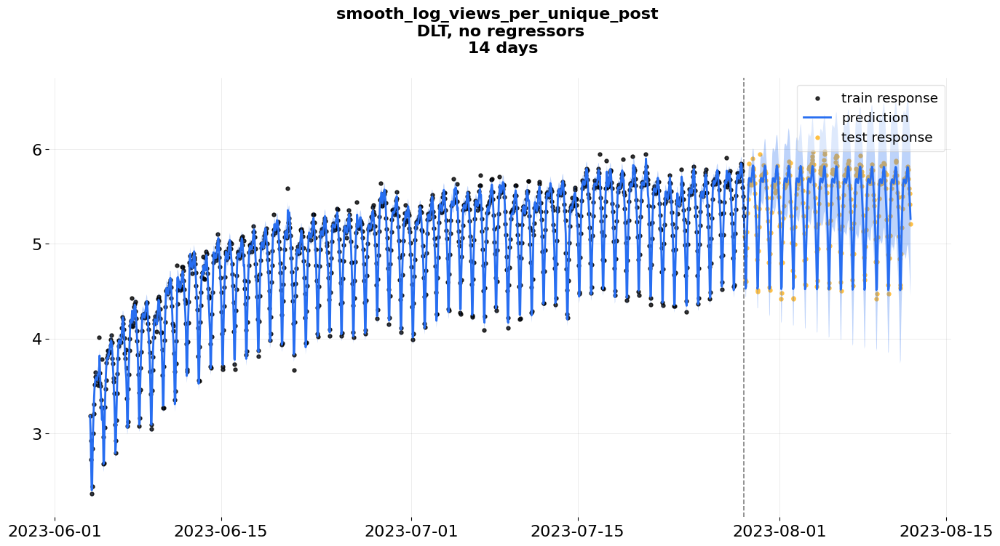

In [41]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

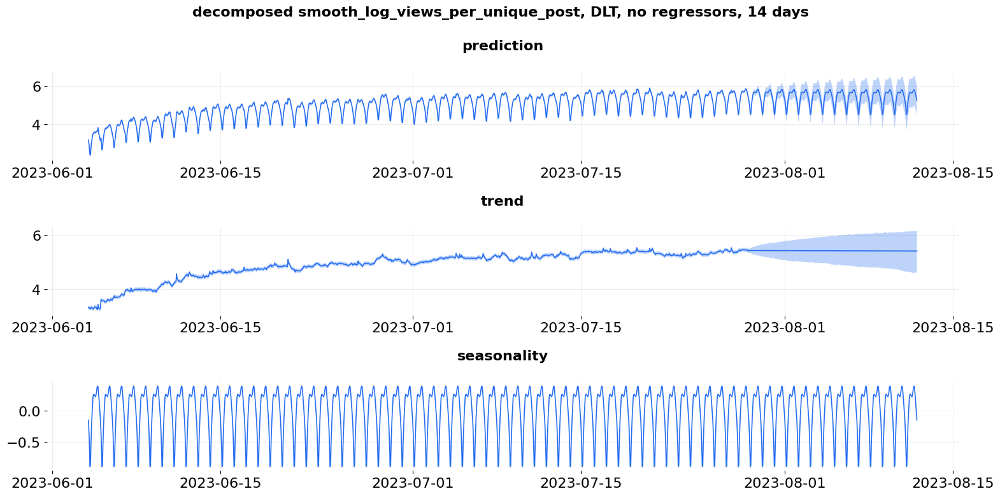

In [42]:
plot_predicted_components(
    predicted_df, 
    date_col,
    plot_components=[
        'prediction', 
        'trend', 
        'seasonality'
    ],
    title=f'decomposed {response_col}, DLT, no regressors, {n_days} days'
);

"Выглядит более разумно, но границы доверительного интервала довольно широки и круты! Прогноз систематически занижает данные.
Несмотря на то, что он работает лучше, наш тренд теряет недельную сезонность и идет постоянно без колебаний.
Попробуйте добавить бинарные регрессоры к логарифмической метрике."

### 2.4. log(views) - with regressor - DLT<a id="2.4-log-views-with-regressor-dlt"></a>


In [43]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [44]:
# initialize a model
log_views_reg_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
          regressor_col=regressor_col,
               )

# train and make a prediction
log_views_reg_dlt.fit(train_df)
predicted_df = log_views_reg_dlt.predict(df=activity_metrics_hour, decompose=True)

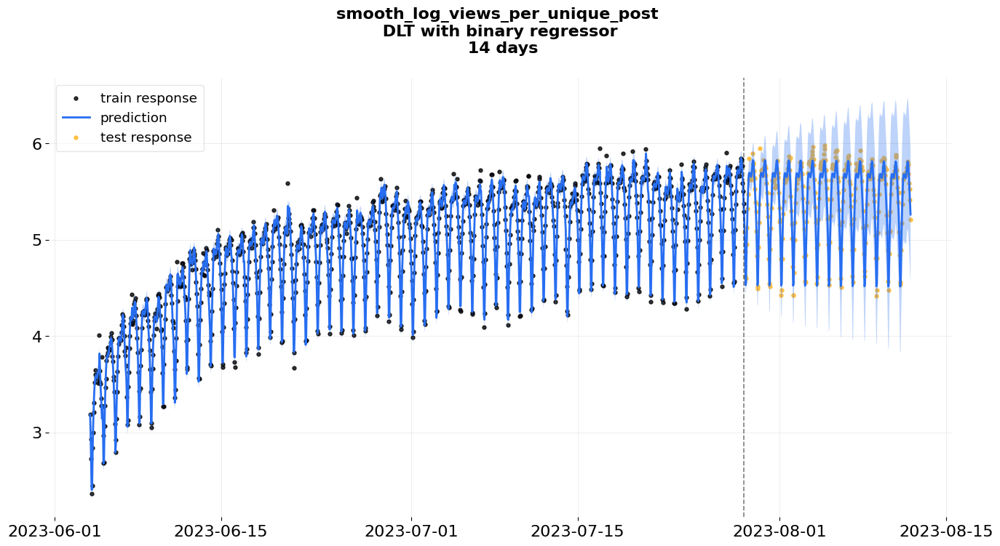

In [45]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT with binary regressor \n {n_days} days',
                       );

Разница не так велика. Наблюдения:
 - Интересно, что даже несмотря на то, что мы предоставили регрессор для увеличенных просмотров во время кампании, модель все равно занизила метрику в течение этого периода.
 - Несмотря на то, что логарифмирование работает лучше, чем стандартизированные просмотры (слишком много падений), оно не сохраняет множественную сезонность.

### 2.5. daily views - with regressor - DLT<a id="2.5-daily-views-with-regressor-dlt"></a>


Независимо от того, что мы делали до сих пор, тренд для просмотров выглядит слишком низким. 
Похоже (особенно по прогнозу на основе логарифмической метрики и декомпозиции просмотров), что наши данные имеют как суточную, так и недельную сезонность, и сейчас мы находимся на еженедельном минимуме, но модель этого не видит и прогнозирует, что тренд будет продолжать идти вниз.   
Чтобы быть уверенными, давайте рассмотрим ежедневные просмотры с регрессорами и недельной сезонностью - как они будут себя вести?

In [46]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_views_per_unique_post'

In [47]:
# initialize a model
daily_z_views_reg_dlt = DLT(
          response_col=response_col,
          date_col='day',
          seasonality=7,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
          regressor_col=regressor_col,
               )

# train and make a prediction
daily_z_views_reg_dlt.fit(activity_metrics_day[:-14])
predicted_df = daily_z_views_reg_dlt.predict(df=activity_metrics_day, decompose=True)

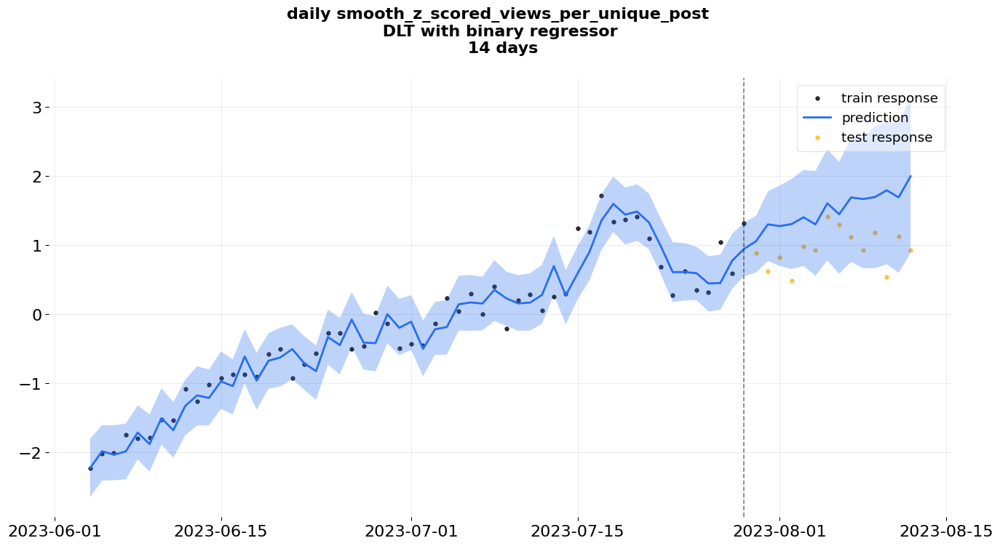

In [48]:
plot_predicted_data(training_actual_df=activity_metrics_day[:-14],
                        predicted_df=predicted_df,
                        date_col='day', 
                        actual_col=response_col,
                        test_actual_df=activity_metrics_day[-14:], 
                        lw=2,
                    title=f'daily {response_col} \n DLT with binary regressor \n {n_days} days',
                       );

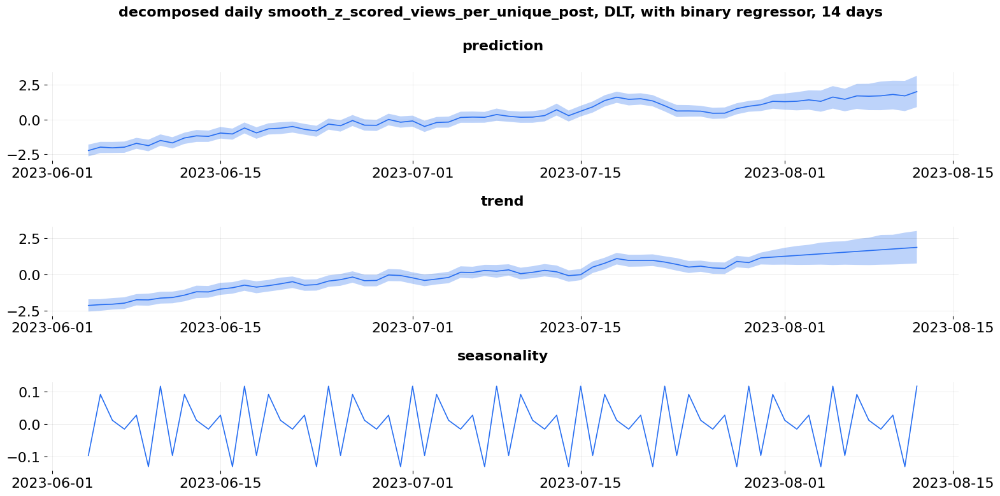

In [49]:
plot_predicted_components(
    predicted_df, 
    'day',
    plot_components=[
        'prediction', 
        'trend', 
        'seasonality'
    ],
    title=f'decomposed daily {response_col}, DLT, with binary regressor, {n_days} days'
);

Этот вариант выглядит лучше, чем ежечасовые линейные просмотры, пробует добавить недельную сезонность. Однако он завышает данные.
Наконец, попробуйте модель KTR для метрики +- регрессоры.

### 2.6. log(views) - no regressors - KTR<a id="2.6-log-views-no-regressors-ktr"></a>


In [50]:
# set new arguments for a model to account for 
# multiple seasonality
date_col = 'hour'
seasonality = [24, 168]
regressor_col = ['jump_campaign']

In [51]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [52]:
# initialize a model
smooth_log_views_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

# train and make a prediction
smooth_log_views_ktr.fit(train_df)
predicted_df = smooth_log_views_ktr.predict(df=activity_metrics_hour, decompose=True)

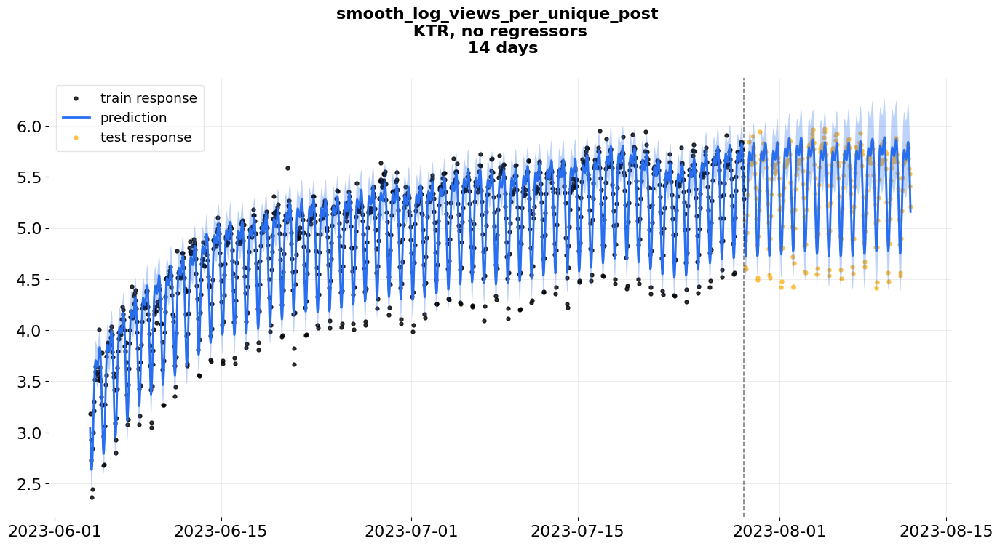

In [53]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n KTR, no regressors \n {n_days} days',
                       );

### 2.7. log(views) - with regressor - KTR<a id="2.7-log-views-with-regressor-ktr"></a>


In [54]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [55]:
# initialize a model
log_views_reg_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
    regressor_col=regressor_col,
)

# train and make a prediction
log_views_reg_ktr.fit(train_df)
predicted_df = log_views_reg_ktr.predict(df=activity_metrics_hour, decompose=True)

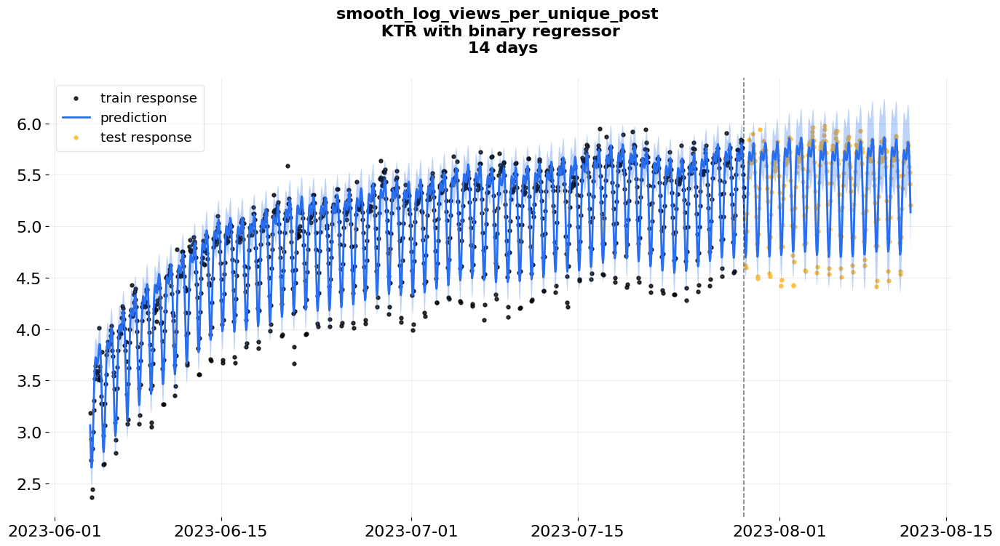

In [56]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n KTR with binary regressor \n {n_days} days',
                       );

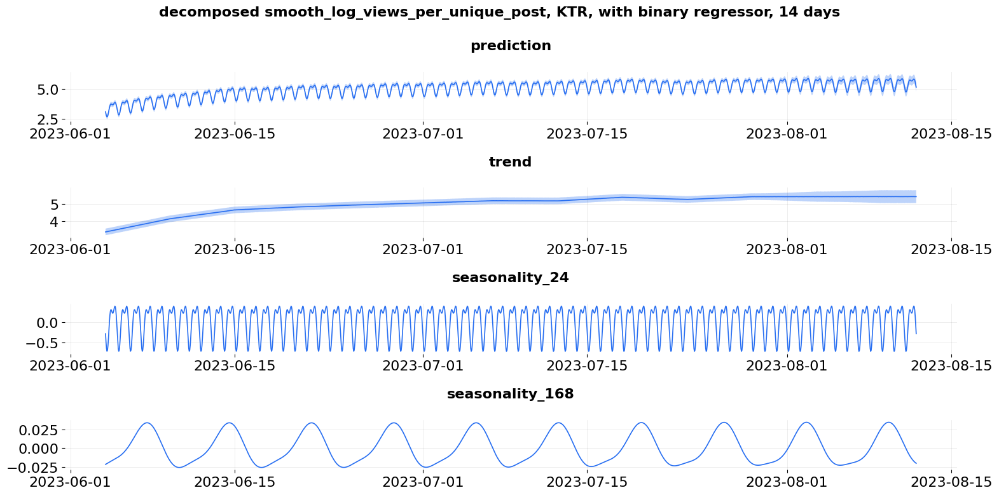

In [57]:
plot_predicted_components(
    predicted_df, 
    date_col,
    plot_components=[
        'prediction', 
        'trend', 
        'seasonality_24',
        'seasonality_168'
    ],
    title=f'decomposed {response_col}, KTR, with binary regressor, {n_days} days'
);

Очень схоже.
А если мы попробуем использовать дневные просмотры?

### 2.8. daily views - with regressor - KTR<a id="2.8-daily-views-with-regressor-ktr"></a>


In [58]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_views_per_unique_post'

In [59]:
# initialize a model
daily_z_views_reg_ktr = KTR(
    response_col=response_col,
    date_col='day',
    seasonality=7,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
    regressor_col=regressor_col,
)

# train and make a prediction
daily_z_views_reg_ktr.fit(activity_metrics_day[:-14])
predicted_df = daily_z_views_reg_ktr.predict(df=activity_metrics_day, decompose=True)

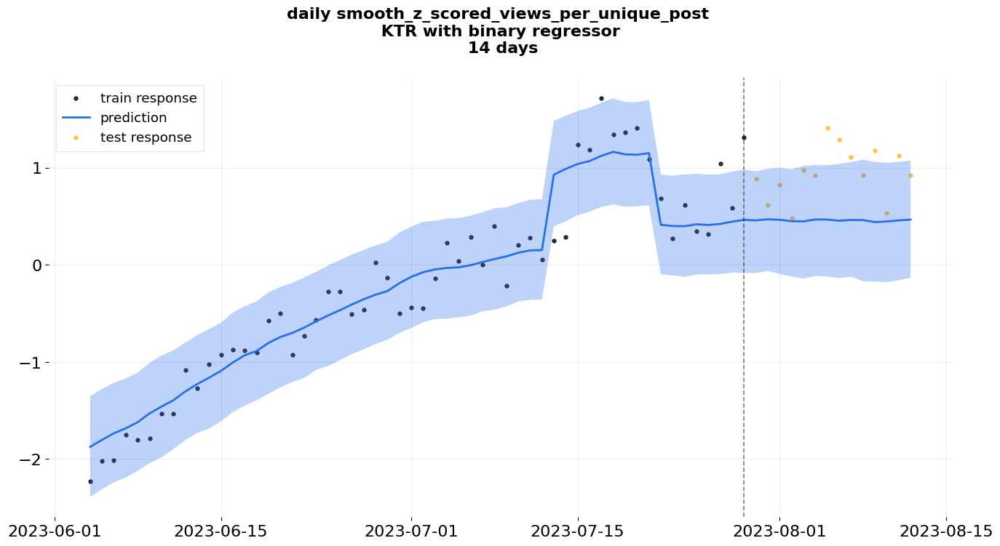

In [60]:
plot_predicted_data(training_actual_df=activity_metrics_day[:-14],
                        predicted_df=predicted_df,
                        date_col='day', 
                        actual_col=response_col,
                        test_actual_df=activity_metrics_day[-14:], 
                        lw=2,
                    title=f'daily {response_col} \n KTR with binary regressor \n {n_days} days',
                       );

[Link to 2.8. daily views - with regressor - KTR](#2.8-daily-views-with-regressor-ktr)


Это дает нам более пессимистичный прогноз с недооценкой данных. Кроме того, по каким-то причинам оно не учитывает недельную сезонность.

### 2.9. Summary<a id="2.9-summary"></a>

- Для стандартизированных метрик в DLT тренд не соответствует действительности и занижает данные;
- Для логарифмической метрики в DLT тренд выглядит лучше, но границы доверительного интервала становятся слишком широкими со временем. В модели KTR прогноз узкий, но ее доверительный интервал охватывает наблюдения;
- Модель KTR на логарифмических просмотрах в целом завышает данные обучения;
- Присутствие регрессора не сильно изменяет прогноз для логарифмической метрики как в DLT, так и в KTR;
- Ежедневные стандартизированные просмотры в DLT выглядят верно (немного оптимистично), но прогноз модели KTR занижает данные.

Давайте рассмотрим несколько комбинаций, сравним их с помощью обратного тестирования и выберем ту, которая имеет наименьшую ошибку:
 - логарифмические просмотры, без регрессоров, в модели KTR;
 - логарифмические просмотры, без регрессоров, в модели DLT;
 - ежедневные стандартизированные просмотры с регрессорами в модели DLT.

### 2.10. Questions and notes <a id="section-2.10"></a>

- Почему прогноз по часовой стандартизованной метрике слишком низкий? Я попробовал изменить коэффициент затухания - это не помогло.
- Почему модель KTR дает более узкие интервалы, чем модель DLT?
- Кроме стандартизации, логарифмирования или преобразования boxcox метрики, каким еще образом можно справиться с нестационарностью здесь?

## 3. Optimizing the regressor forecast <a id="3-optimizing-the-regressor-forecast"></a>


Теперь нам нужно принять решение:
1. какой регрессор мы выберем
2. на какие параметры мы будем ориентироваться (коэффициент затухания для DLT и длина прогноза).

### 3.1. Backtest of log views, no regressors, DLT <a id="3.1-backtest-of-log-views-no-regressors-dlt"></a>


Прогноз на 14 дней и просмотрите каждую итерацию разбиения - тренд и метрику smape.
Мы будем использовать расширяющееся окно, так как метрика, кажется, не очень волатильна.

In [61]:
response_col = 'smooth_log_views_per_unique_post'
date_col = 'hour'
seasonality = 24
regressor_col = ['jump_campaign']

In [62]:
# initialize a model
model = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

In [63]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, #наша моделька
    df=activity_metrics_hour, #датафрейм для обучения
    min_train_len=24*7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=24*7, #на сколько происходит прирост тренировочных данных
    forecast_len=24*forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

In [64]:
bt_obj.fit_predict() #обучаем

In [65]:
bt_obj.score() #выводим метрики

,metric_name,metric_values,is_training_metric
0,smape,0.025,False
1,wmape,0.025,False
2,mape,0.025,False
3,mse,0.028,False
4,mae,0.129,False
5,rmsse,1.012,False


In [66]:
predicted_df = bt_obj.get_predicted_df()

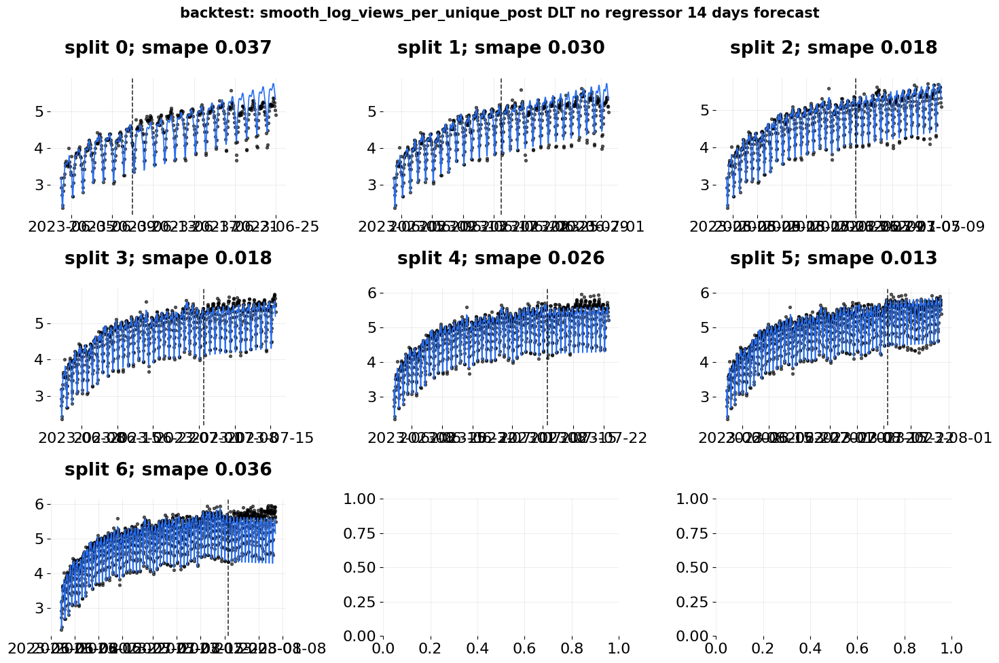

In [67]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} DLT no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Мы видим два спада: на разбиении 4 и разбиении 6 - такое поведение (тренд просто идет вниз) может быть признаком систематической недооценки нашего прогноза, если мы выберем его.

### 3.2. Backtest of log views, no regressors, KTR <a id="3.2-backtest-of-log-views-no-regressors-ktr"></a>


In [68]:
# set our arguments for the model and a plot
response_col = 'smooth_log_views_per_unique_post'

In [69]:
# initialize a model
model = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=[24, 168],
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

In [70]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, #наша моделька
    df=activity_metrics_hour, #датафрейм для обучения
    min_train_len=24*7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=24*7, #на сколько происходит прирост тренировочных данных
    forecast_len=24*forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

In [71]:
bt_obj.fit_predict() #обучаем

In [72]:
bt_obj.score() #выводим метрики

,metric_name,metric_values,is_training_metric
0,smape,0.056,False
1,wmape,0.051,False
2,mape,0.053,False
3,mse,0.140,False
4,mae,0.260,False
5,rmsse,2.274,False


In [73]:
predicted_df = bt_obj.get_predicted_df()

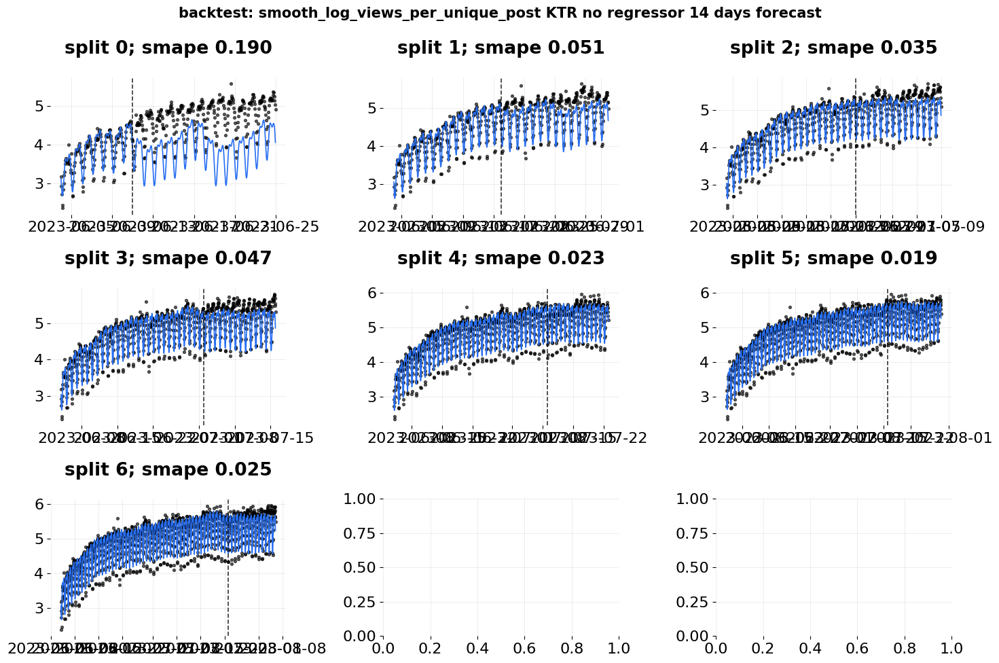

In [74]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} KTR no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Здесь также есть спады - разбиения 3 и 6. Однако тренд здесь не идет вниз слишком сильно.

### 3.3. Backtest of daily views, no regressors, DLT <a id="3.3-backtest-of-daily-views-no-regressors-dlt"></a>


In [75]:
response_col = 'smooth_z_scored_views_per_unique_post'
date_col = 'day'
seasonality = 7
regressor_col = ['jump_campaign']

In [76]:
# initialize a model
model = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

In [77]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, #наша моделька
    df=activity_metrics_day, #датафрейм для обучения
    min_train_len=7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=7, #на сколько происходит прирост тренировочных данных
    forecast_len=forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

In [78]:
bt_obj.fit_predict() #обучаем

In [79]:
bt_obj.score() #выводим метрики

,metric_name,metric_values,is_training_metric
0,smape,0.916,False
1,wmape,1.017,False
2,mape,5.112,False
3,mse,0.784,False
4,mae,0.683,False
5,rmsse,2.209,False


In [80]:
predicted_df = bt_obj.get_predicted_df()

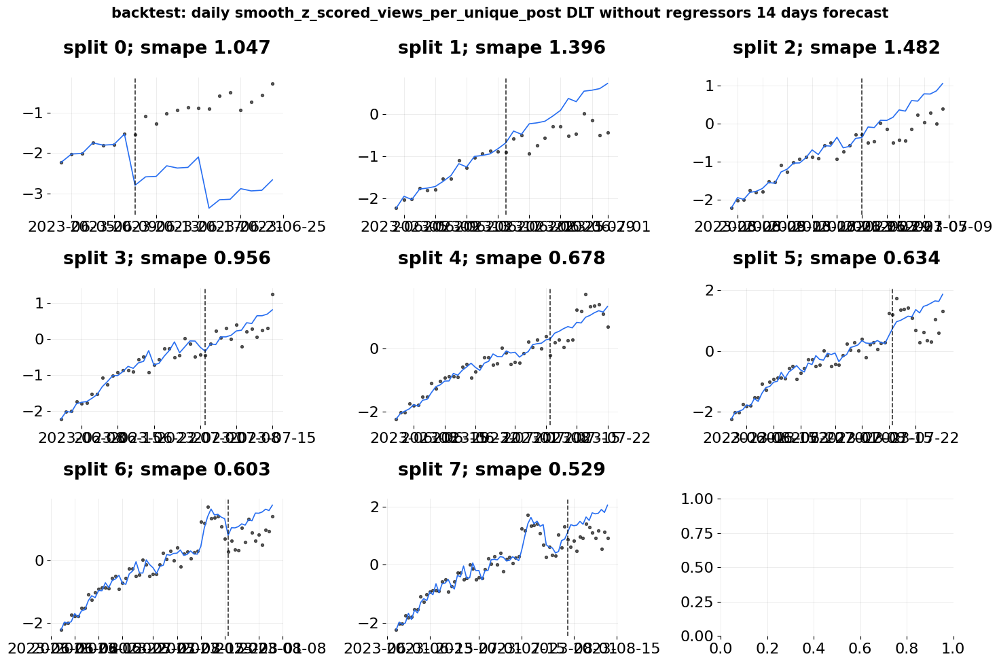

In [81]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: daily {response_col} DLT without regressors {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Снова, как и ранее, у нас здесь наблюдается переоценка.  
Теперь итерации с регрессорами.

### 3.4. Backtest of views with regressor, DLT <a id="3.4-backtest-of-views-with-regressor-dlt"></a>


In [82]:
# initialize a model
model = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
          regressor_col=regressor_col,
               )

In [83]:
forecast_len = 14

# create a backtester object
bt_obj = BackTester(
    model=model, #наша моделька
    df=activity_metrics_day, #датафрейм для обучения
    min_train_len=7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=7, #на сколько происходит прирост тренировочных данных
    forecast_len=forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

In [84]:
bt_obj.fit_predict() #обучаем

In [85]:
bt_obj.score() #выводим метрики

,metric_name,metric_values,is_training_metric
0,smape,0.909,False
1,wmape,1.056,False
2,mape,5.153,False
3,mse,0.995,False
4,mae,0.709,False
5,rmsse,2.488,False


In [86]:
predicted_df = bt_obj.get_predicted_df()

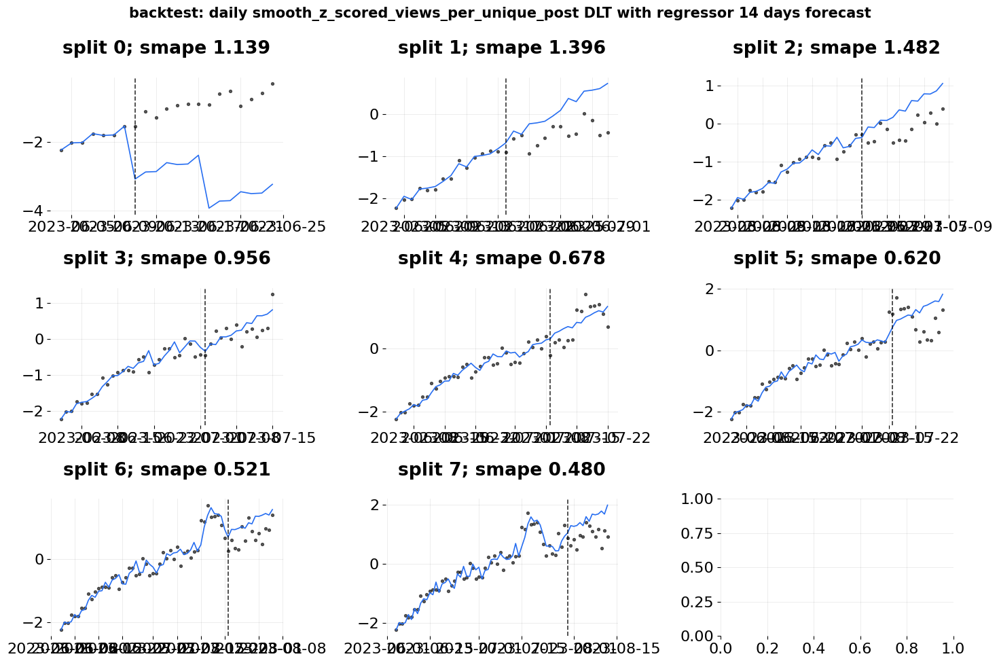

In [87]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: daily {response_col} DLT with regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Кажется, что это работает лучше, но все равно происходит переоценка.

### 3.5. Choosing metric type and the model for the regressor <a id="3.5-choosing-metric-type-and-the-model-for-the-regressor"></a>


- Давайте отбросим стандартизированные ежедневные просмотры с моделью DLT - она завышает данные и в фактическом прогнозе не учитывает никакой сезонности, просто дает прямую линию в качестве тренда (не показано в этом ноутбуке);
- Давайте отбросим логарифмические просмотры с моделью DLT - она дает слишком пессимистичные прогнозы без стабильности;
- Давайте оставим логарифмические просмотры с моделью KTR - она менее чувствительна к снижениям, сохраняет тренд более стабильным и даже обеспечивает некоторую многократную сезонность. Кроме того, границы ее доверительных интервалов могут быть нашими «пессимистичными» и «оптимистичными» прогнозами.

Теперь давайте посмотрим, насколько далеко в будущем мы можем оптимально прогнозировать с этой моделью. Мы будем итерироваться по различным значениям `forecast_len` и искать оптимальные комбинации `forecast_len` и `smape`.

In [88]:
response_col = 'smooth_log_views_per_unique_post'
date_col = 'hour'
seasonality = [24, 168]

In [89]:
forecast_lens = np.arange(5, 35, 5)

evaluation_scores = pd.DataFrame({'metric_name': ['smape', 'wmape', 'mape', 'mse', 'mae', 'rmsse']})

In [90]:
model = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

for forecast_len in forecast_lens:
    
    bt_obj = BackTester(
        model=model, #наша моделька
        df=activity_metrics_hour, #датафрейм для обучения
        min_train_len=24*7, #самый маленький кусочек данных, с которого начинается обучение
        incremental_len=24*7, #на сколько происходит прирост тренировочных данных
        forecast_len=24*forecast_len, #горизонт пронозирования
        window_type="expanding" #тип окошка
    )

    bt_obj.fit_predict() #обучаем

    evaluation_scores[f'{forecast_len}_days'] = bt_obj.score().metric_values
    

In [91]:
evaluation_scores = evaluation_scores.set_index('metric_name').T.reset_index()
evaluation_scores

metric_name,index,smape,wmape,mape,mse,mae,rmsse
0,5_days,0.042,0.038,0.040,0.089,0.195,1.779
1,10_days,0.049,0.044,0.046,0.120,0.227,2.085
2,15_days,0.057,0.052,0.054,0.148,0.268,2.332
3,20_days,0.064,0.058,0.059,0.184,0.299,2.603
4,25_days,0.076,0.069,0.071,0.249,0.359,3.029
5,30_days,0.093,0.085,0.086,0.327,0.437,3.469


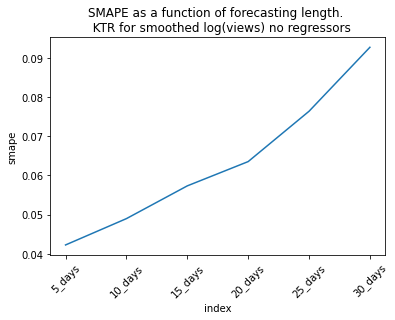

In [92]:
sns.lineplot(data=evaluation_scores,
             x='index',
             y='smape',
            )
plt.xticks(rotation=45)
plt.title('SMAPE as a function of forecasting length. \n  KTR for smoothed log(views) no regressors')
plt.show()

Как мы видим, при прогнозе на примерно 20 дней, мы наблюдаем изменение поведения ошибки - ошибка становится выше для того же увеличения длины прогноза (меняется характер роста).   
Давайте установим длину прогноза в 3 недели - 21 день.   
Теперь создадим фрейм данных для прогнозирования целевых значений - на 21 день вперед с тремя столбцами, содержащими предсказанные значения регрессоров: нижнюю границу доверительного интервала, среднее значение и верхнюю границу доверительного интервала.

Make a prediction 21 days into the future first.

In [93]:
response_col = 'smooth_log_views_per_unique_post'
date_col = 'hour'
seasonality = [24, 168]
train_df = activity_metrics_hour
n_days = 21

In [94]:
# initialize a model
smooth_log_views_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=seasonality,
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

# train and make a prediction
smooth_log_views_ktr.fit(train_df)

future_df = smooth_log_views_ktr.make_future_df(periods=24*n_days) 

predicted_df = smooth_log_views_ktr.predict(df=future_df, decompose=True)

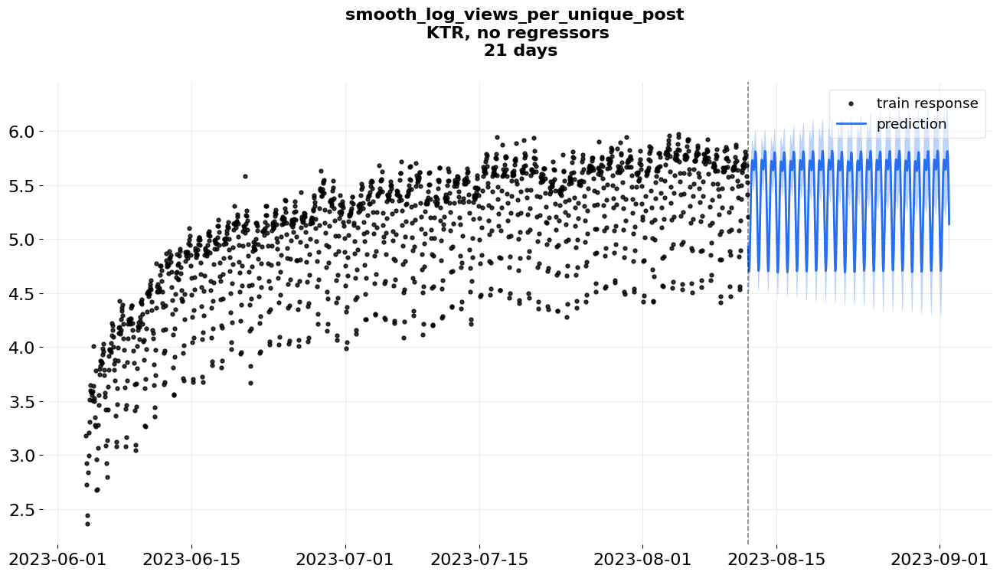

In [95]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, no regressors \n {n_days} days',
                       );

Интересно, что мы теряем недельную сезонность при прогнозировании в будущее.

Save the predicted values into a dataframe - we will need them later for target forecasts.

In [96]:
predicted_df.head()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
0,2023-08-12 01:00:00,4.728,4.926,5.118,5.215,5.414,5.605,0.000,0.000,0.000,-0.488,-0.488,-0.488,0.001,0.001,0.001
1,2023-08-12 02:00:00,4.575,4.772,4.967,5.217,5.414,5.609,0.000,0.000,0.000,-0.642,-0.642,-0.642,0.001,0.001,0.001
2,2023-08-12 03:00:00,4.504,4.702,4.901,5.216,5.413,5.612,0.000,0.000,0.000,-0.712,-0.712,-0.712,0.001,0.001,0.001
3,2023-08-12 04:00:00,4.531,4.728,4.924,5.215,5.412,5.608,0.000,0.000,0.000,-0.685,-0.685,-0.685,0.001,0.001,0.001
4,2023-08-12 05:00:00,4.645,4.848,5.044,5.212,5.415,5.611,0.000,0.000,0.000,-0.568,-0.568,-0.568,0.001,0.001,0.001


In [97]:
regressor_df = predicted_df.iloc[:, :4]

regressor_df.tail()

,hour,prediction_5,prediction,prediction_95
499,2023-09-01 20:00:00,5.365,5.809,6.248
500,2023-09-01 21:00:00,5.277,5.722,6.171
501,2023-09-01 22:00:00,5.129,5.576,6.012
502,2023-09-01 23:00:00,4.914,5.365,5.811
503,2023-09-02 00:00:00,4.693,5.141,5.584


## 4. Forecasting target metric <a id="4-forecasting-target-metric"></a>


Сначала мы выберем тип метрики для целевой метрики - активных пользователей по часам (снова «сглаженных» 22 июля):
- пользователи (стандартизированные)
- логарифм числа пользователей

Затем мы увидим разные прогнозы для нашей целевой метрики:
- без регрессоров,
- с пессимистичным регрессором,
- с оптимистичным регрессором.

Если мы видим, что получаем что-то среднее в модели без регрессоров, мы отбрасываем ее и полагаемся только на модели с включенными регрессорами.

Мы также попробуем модели DLT и KTR.

Let's get a visual overview how the forecast looks.

### 4.1. target - no regressors - DLT <a id="4.1-target-no-regressors-dlt"></a>


In [98]:
# first, separate our df into train and split parts
n_days = 21
test_size=24 * n_days

train_df=activity_metrics_hour[:-test_size]
test_df=activity_metrics_hour[-test_size:]

In [99]:
date_col = 'hour'
seasonality = 24

In [100]:
# set our arguments for the model and a plot
response_col = 'smooth_z_scored_active_users'

In [101]:
# initialize a model
users_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
users_dlt.fit(train_df)
predicted_df = users_dlt.predict(df=activity_metrics_hour, decompose=True)

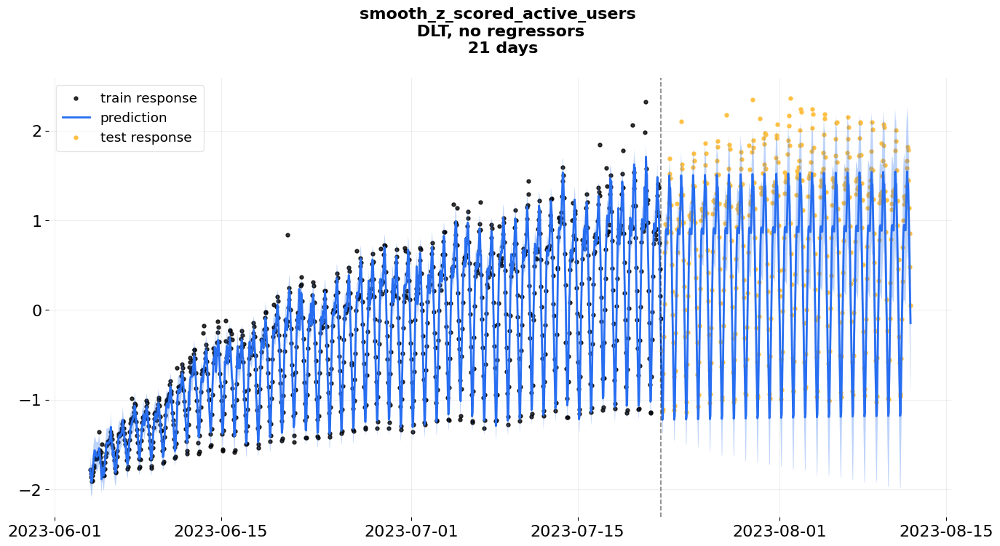

In [102]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

Let's do forecasting onto real future.

In [103]:
# train and make a prediction
users_dlt.fit(activity_metrics_hour)

future_df = users_dlt.make_future_df(periods=24*n_days) 
users_dlt_predicted = users_dlt.predict(df=future_df, decompose=True)

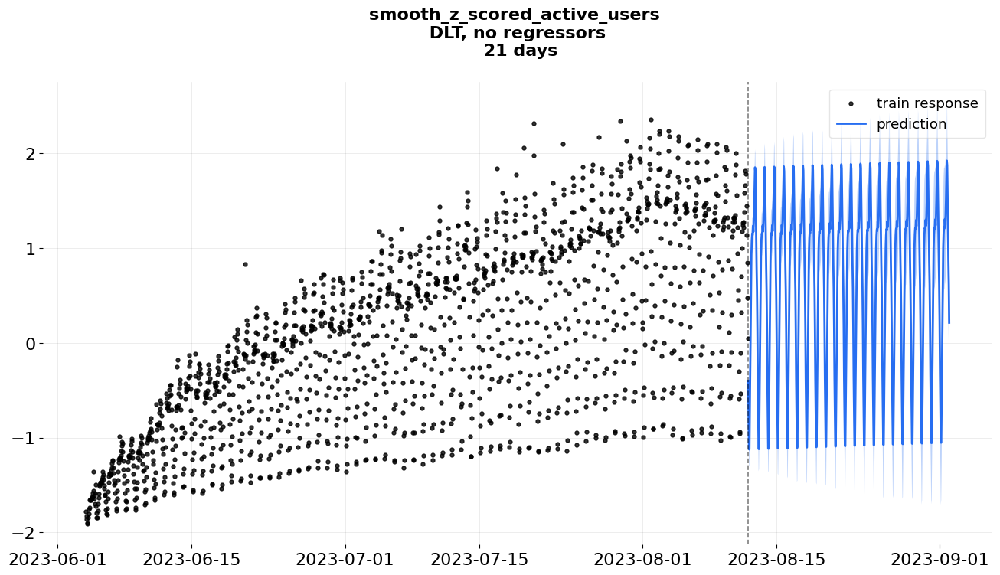

In [104]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=users_dlt_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

Let's see at the behaviour of log metric

### 4.2. log(users) - no regressors - DLT <a id="4.2-log-users-no-regressors-dlt"></a>


In [105]:
# set our arguments for the model and a plot
response_col = 'smooth_log_active_users'

In [106]:
# initialize a model
log_users_dlt = DLT(
          response_col=response_col,
          date_col=date_col,
          seasonality=seasonality,
          estimator="stan-map",
          n_bootstrap_draws=1e3,
               )

# train and make a prediction
log_users_dlt.fit(train_df)
predicted_df = log_users_dlt.predict(df=activity_metrics_hour, decompose=True)

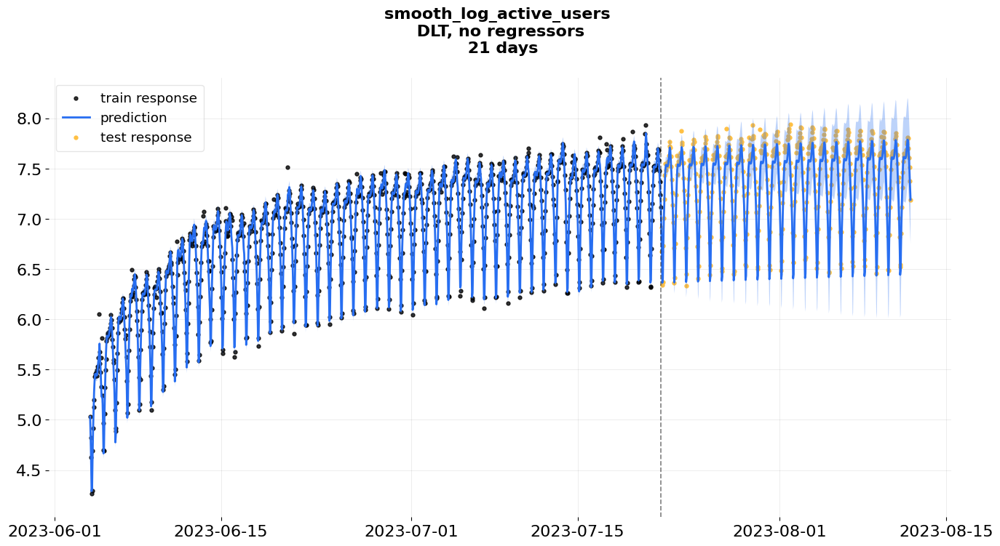

In [107]:
plot_predicted_data(training_actual_df=train_df,
                        predicted_df=predicted_df,
                        date_col=date_col, 
                        actual_col=response_col,
                        test_actual_df=test_df, 
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

In [108]:
# train and make a prediction
log_users_dlt.fit(activity_metrics_hour)

future_df = log_users_dlt.make_future_df(periods=24*n_days) 
users_dlt_predicted = log_users_dlt.predict(df=future_df, decompose=True)

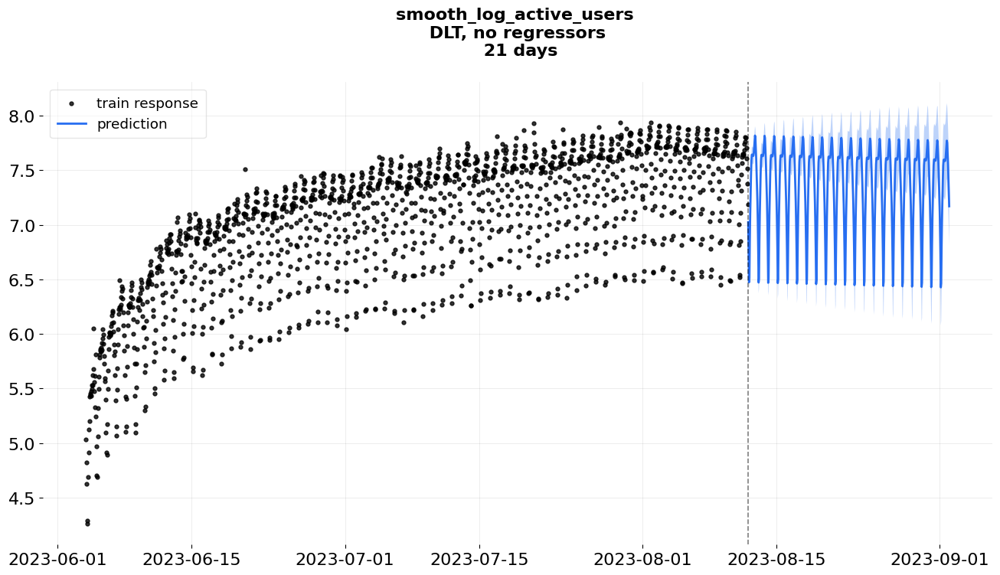

In [109]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=users_dlt_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n DLT, no regressors \n {n_days} days',
                       );

Вместо роста (как в случае со стандартизированными метриками), прогноз здесь идет вниз. Теперь мы проведем обратное тестирование для этих двух комбинаций, найдем лучшую из них и попробуем добавить регрессоры.

### 4.3. Choosing metric type for the target <a id="4.3-choosing-metric-type-for-the-target"></a>


In [110]:
forecast_len = 21

# create a backtester object
bt_obj = BackTester(
    model=users_dlt, #наша моделька
    df=activity_metrics_hour, #датафрейм для обучения
    min_train_len=24*7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=24*7, #на сколько происходит прирост тренировочных данных
    forecast_len=24*forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

log_bt_obj = BackTester(
    model=log_users_dlt, #наша моделька
    df=activity_metrics_hour, #датафрейм для обучения
    min_train_len=24*7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=24*7, #на сколько происходит прирост тренировочных данных
    forecast_len=24*forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

In [111]:
bt_obj.fit_predict() #обучаем
log_bt_obj.fit_predict() #обучаем

In [112]:
predicted_df = bt_obj.get_predicted_df()
log_predicted_df = log_bt_obj.get_predicted_df()

It is not log - it is z-scored metric!

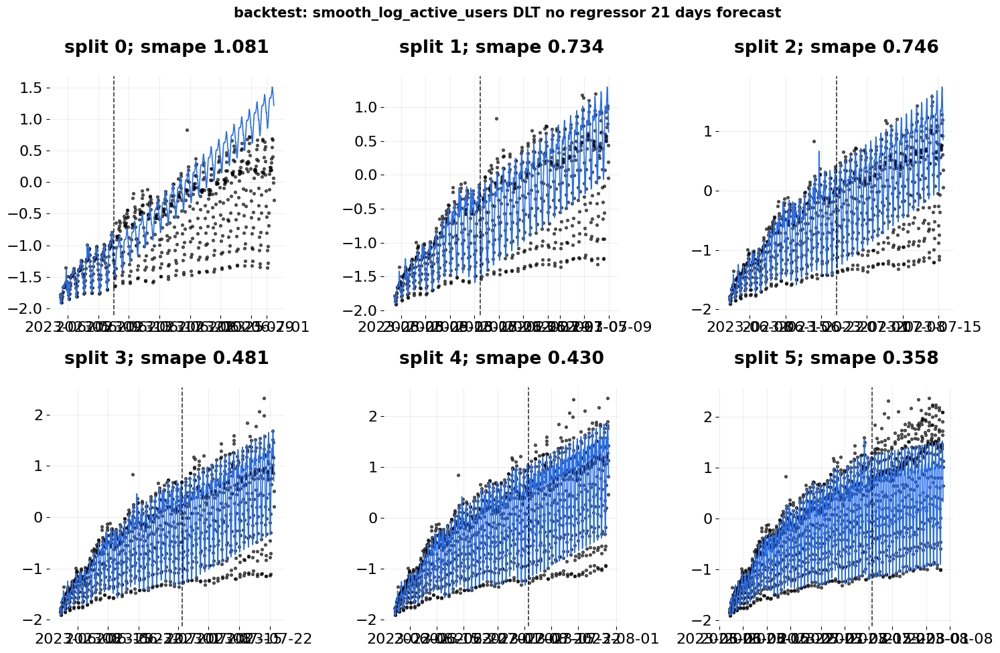

In [113]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} DLT no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

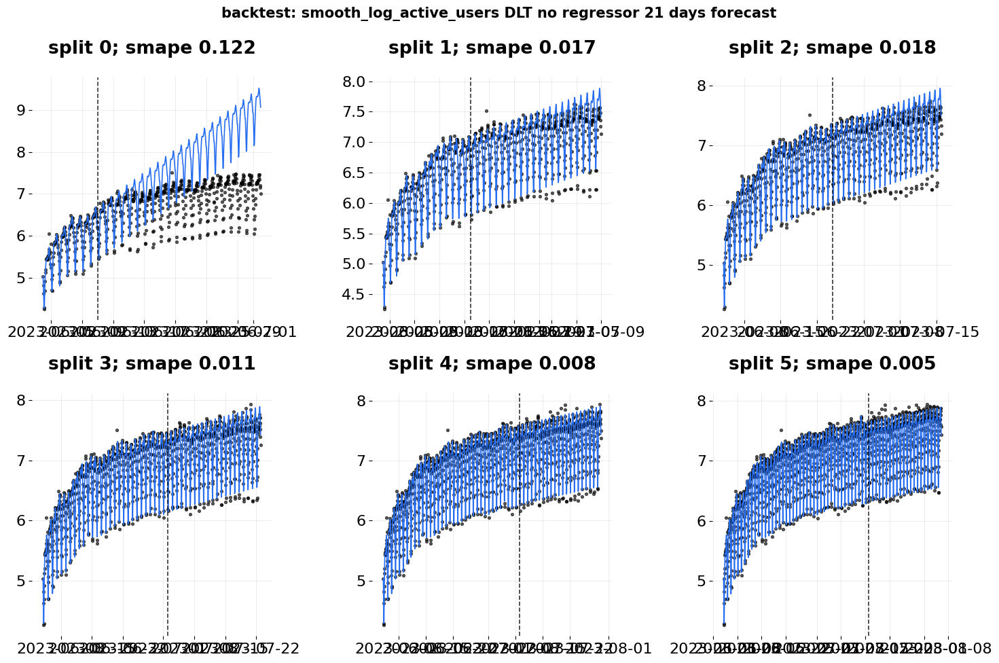

In [114]:
plot_bt_predictions(
    log_predicted_df, 
    title=f'backtest: {response_col} DLT no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

Давайте продолжим с логарифмом - кажется, что он работает лучше для большего числа разбиений, чем линейная метрика, которая показала более реалистичные прогнозы только на последнем разбиении.   
Будет ли KTR работать здесь лучше, чем DLT?

### 4.4. log(users) - no regressors - KTR <a id="4.4-log-users-no-regressors-ktr"></a>


In [115]:
# set our arguments for the model and a plot
response_col = 'smooth_log_active_users'

In [116]:
forecast_len = 21

# initialize a model
log_users_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=[24, 168],
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
)

bt_obj = BackTester(
    model=log_users_ktr, #наша моделька
    df=activity_metrics_hour, #датафрейм для обучения
    min_train_len=24*7, #самый маленький кусочек данных, с которого начинается обучение
    incremental_len=24*7, #на сколько происходит прирост тренировочных данных
    forecast_len=24*forecast_len, #горизонт пронозирования
    window_type="expanding" #тип окошка
)

In [117]:
bt_obj.fit_predict() #обучаем

In [118]:
predicted_df = bt_obj.get_predicted_df()

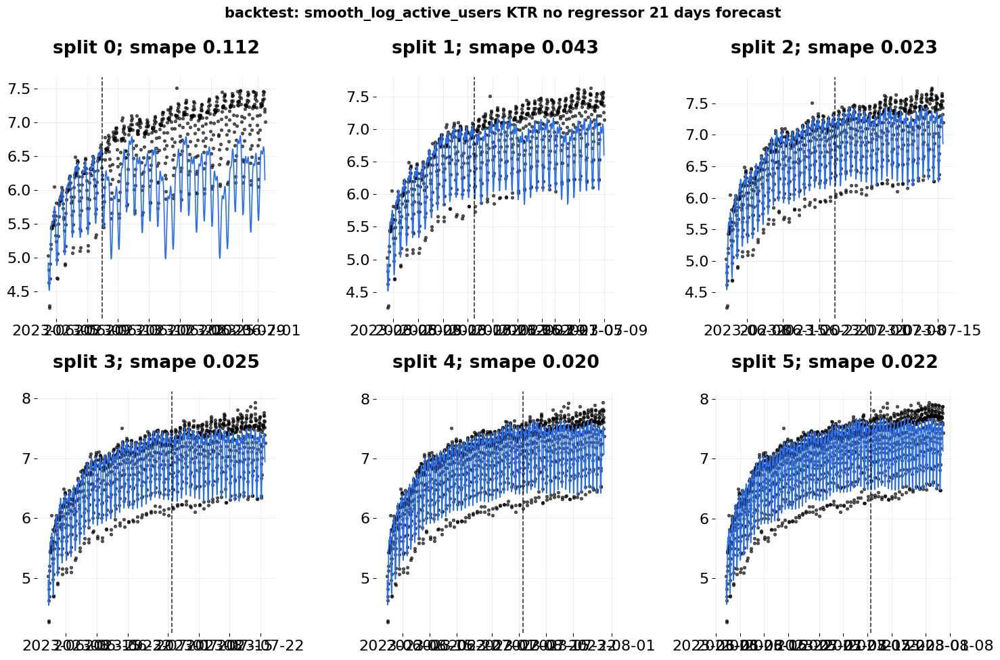

In [119]:
plot_bt_predictions(
    predicted_df, 
    title=f'backtest: {response_col} KTR no regressor {forecast_len} days forecast',
    metrics=orbit.diagnostics.metrics.smape, 
    ncol=3, 
    figsize=(15, 10), 
    include_vline=True, 
    fontsize=15
);

and look how the future forecast looks like now

In [120]:
# train and make a prediction
log_users_ktr.fit(activity_metrics_hour);

In [121]:
future_df = log_users_ktr.make_future_df(periods=24*n_days) 
log_users_ktr_predicted = log_users_ktr.predict(df=future_df, decompose=True)

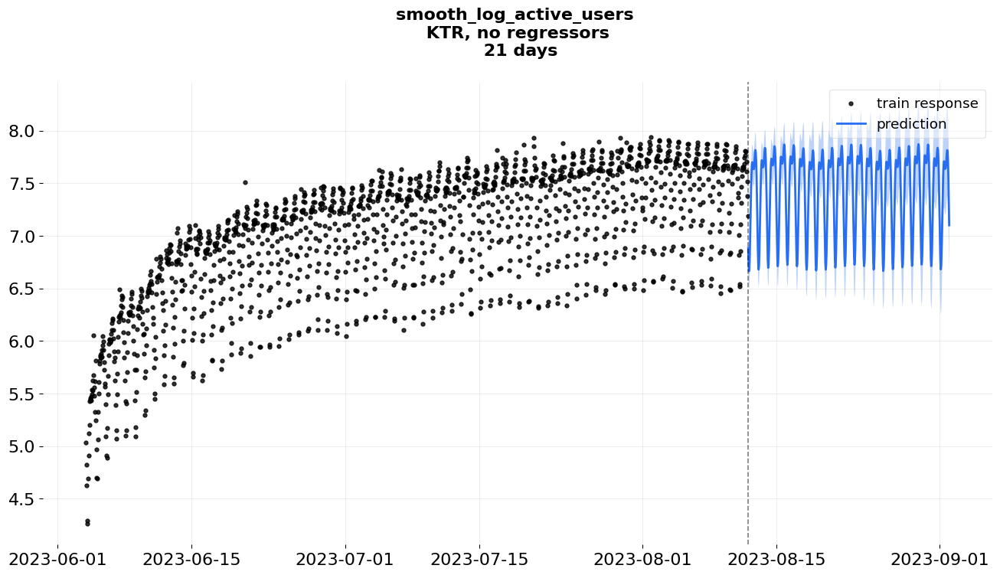

In [122]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=log_users_ktr_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, no regressors \n {n_days} days',
                       );

In [123]:
log_users_ktr_predicted.describe()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
count,504,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000
mean,2023-08-22 12:30:00,7.117,7.421,7.723,7.117,7.421,7.723,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
min,2023-08-12 01:00:00,6.253,6.663,6.828,6.981,7.415,7.580,0.000,0.000,0.000,-0.726,-0.726,-0.726,-0.030,-0.030,-0.030
25%,2023-08-17 06:45:00,6.758,7.085,7.375,7.052,7.420,7.658,0.000,0.000,0.000,-0.318,-0.318,-0.318,-0.019,-0.019,-0.019
50%,2023-08-22 12:30:00,7.291,7.631,7.893,7.116,7.421,7.725,0.000,0.000,0.000,0.208,0.208,0.208,0.000,0.000,0.000
75%,2023-08-27 18:15:00,7.423,7.721,8.042,7.182,7.423,7.791,0.000,0.000,0.000,0.299,0.299,0.299,0.019,0.019,0.019
max,2023-09-02 00:00:00,7.661,7.870,8.261,7.254,7.431,7.860,0.000,0.000,0.000,0.419,0.419,0.419,0.030,0.030,0.030
std,NaN,0.392,0.386,0.397,0.079,0.002,0.080,0.000,0.000,0.000,0.386,0.386,0.386,0.020,0.020,0.020


Несмотря на то что обратное тестирование показывает более плохие результаты для KTR, тренд выглядит более реалистично и сохраняет недельную сезонность. Теперь попробуйте добавить регрессоры здесь.

### 4.5. log(users) - pessimistic regressor - KTR <a id="4.5-log-users-pessimistic-regressor-ktr"></a>


In [124]:
regressor_col = ['smooth_log_views_per_unique_post']

In [125]:
# initialize a model
log_users_reg_ktr = KTR(
    response_col=response_col,
    date_col=date_col,
    seasonality=[24, 168],
    estimator='pyro-svi',
    n_bootstrap_draws=1e4,
    # pyro training config
    num_steps=301,
    message=100,
    regressor_col=regressor_col,
)

In [126]:
# train and make a prediction
log_users_reg_ktr.fit(activity_metrics_hour);

In [127]:
# regressor_df has average and CI border predicted value
# for our smooth log views regressor
future_df = regressor_df.rename(
    columns={
        'prediction_5': 'smooth_log_views_per_unique_post'
    }
)

# make a forecast
log_users_reg_ktr_predicted = log_users_reg_ktr.predict(
    df=future_df.loc[:, ['hour', 'smooth_log_views_per_unique_post']], 
    decompose=True
)

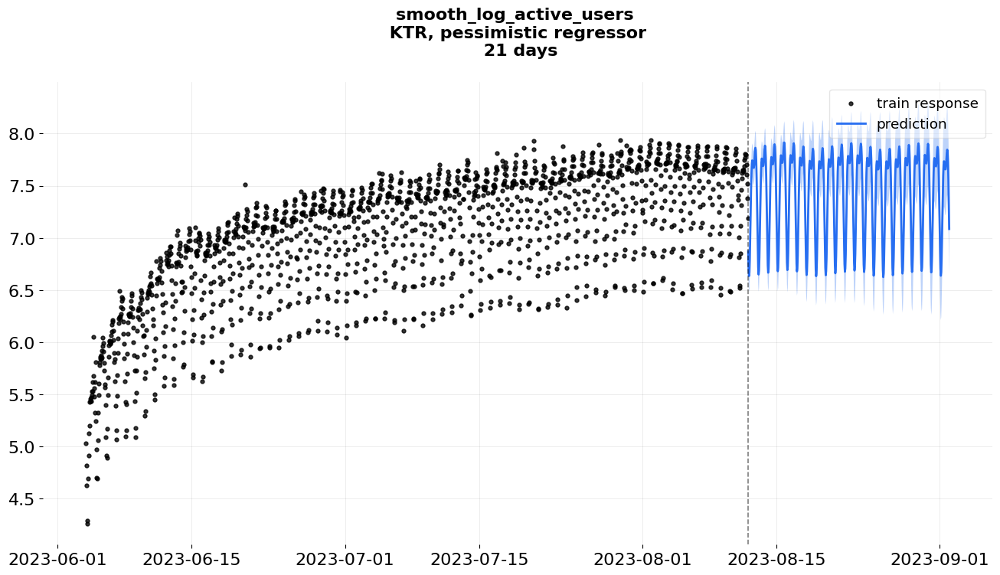

In [128]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=log_users_reg_ktr_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, pessimistic regressor \n {n_days} days',
                       );

In [129]:
log_users_reg_ktr_predicted.describe()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
count,504,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000
mean,2023-08-22 12:30:00,7.132,7.434,7.732,6.780,7.082,7.380,0.332,0.352,0.375,0.000,0.000,0.000,0.000,0.000,0.000
min,2023-08-12 01:00:00,6.212,6.624,6.795,6.644,7.076,7.235,0.278,0.295,0.315,-0.726,-0.726,-0.726,-0.030,-0.030,-0.030
25%,2023-08-17 06:45:00,6.751,7.077,7.366,6.714,7.080,7.313,0.310,0.328,0.351,-0.318,-0.318,-0.318,-0.019,-0.019,-0.019
50%,2023-08-22 12:30:00,7.317,7.657,7.924,6.776,7.082,7.382,0.343,0.364,0.388,0.208,0.208,0.208,0.000,0.000,0.000
75%,2023-08-27 18:15:00,7.457,7.752,8.070,6.845,7.084,7.449,0.351,0.372,0.397,0.299,0.299,0.299,0.019,0.019,0.019
max,2023-09-02 00:00:00,7.712,7.914,8.291,6.920,7.091,7.517,0.365,0.387,0.414,0.419,0.419,0.419,0.030,0.030,0.030
std,NaN,0.418,0.412,0.422,0.080,0.003,0.081,0.025,0.026,0.028,0.386,0.386,0.386,0.020,0.020,0.020


### 4.6. smooth log target - optimistic regressor - KTR <a id="4.6-smooth-log-target-optimistic-regressor-ktr"></a>


In [130]:
# regressor_df has average and CI border predicted value
# for our smooth log views regressor
future_df = regressor_df.rename(
    columns={
        'prediction_95': 'smooth_log_views_per_unique_post'
    }
)

# make a forecast
log_users_reg_ktr_predicted = log_users_reg_ktr.predict(
    df=future_df.loc[:, ['hour', 'smooth_log_views_per_unique_post']], 
    decompose=True
)

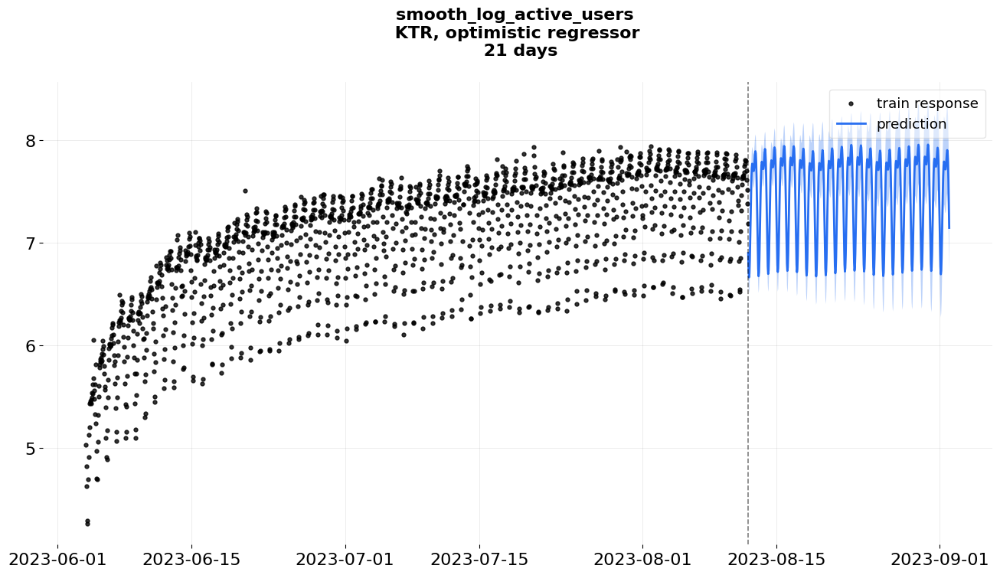

In [131]:
plot_predicted_data(training_actual_df=activity_metrics_hour,
                        predicted_df=log_users_reg_ktr_predicted,
                        date_col=date_col, 
                        actual_col=response_col,
                        lw=2,
                    title=f'{response_col} \n KTR, optimistic regressor \n {n_days} days',
                       );

In [132]:
log_users_reg_ktr_predicted.describe()

,hour,prediction_5,prediction,prediction_95,trend_5,trend,trend_95,regression_5,regression,regression_95,seasonality_24_5,seasonality_24,seasonality_24_95,seasonality_168_5,seasonality_168,seasonality_168_95
count,504,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000,504.000
mean,2023-08-22 12:30:00,7.179,7.477,7.785,6.781,7.080,7.388,0.374,0.396,0.430,0.000,0.000,0.000,0.000,0.000,0.000
min,2023-08-12 01:00:00,6.273,6.662,6.823,6.650,7.073,7.237,0.319,0.338,0.367,-0.726,-0.726,-0.726,-0.030,-0.030,-0.030
25%,2023-08-17 06:45:00,6.810,7.122,7.413,6.716,7.079,7.319,0.353,0.374,0.406,-0.318,-0.318,-0.318,-0.019,-0.019,-0.019
50%,2023-08-22 12:30:00,7.371,7.698,7.960,6.778,7.080,7.390,0.385,0.408,0.443,0.208,0.208,0.208,0.000,0.000,0.000
75%,2023-08-27 18:15:00,7.509,7.795,8.124,6.845,7.081,7.461,0.393,0.417,0.453,0.299,0.299,0.299,0.019,0.019,0.019
max,2023-09-02 00:00:00,7.741,7.955,8.359,6.924,7.084,7.523,0.408,0.432,0.469,0.419,0.419,0.419,0.030,0.030,0.030
std,NaN,0.416,0.412,0.425,0.078,0.002,0.085,0.025,0.027,0.029,0.386,0.386,0.386,0.020,0.020,0.020


### 4.7. Choosing the model type and regressor type. <a id="4.7-choosing-the-model-type-and-regressor-type"></a>


- Разница между прогнозами без регрессоров и с регрессорами не очень велика.
- Тем не менее, давайте выберем оптимистичный прогноз и его верхнюю границу доверительного интервала в качестве верхней границы нагрузки на сервер - это самая высокая оценка, доступная в текущей модели KTR.
- Точно так же давайте выберем нижнюю границу доверительного интервала пессимистичного прогноза в качестве самой низкой оценки.
- В качестве наиболее вероятного сценария мы можем использовать среднее значение прогноза без регрессоров.

## 5. Conclusions <a id="5-conclusions"></a>


### 5.1. Summary of the work and the results <a id="5.1-summary-of-the-work-and-the-results"></a>


1. В начале мы выбрали активных пользователей в час в качестве целевой метрики для прогноза нагрузки на сервер. Эта метрика отражала нагрузку, не имела сильных аномалий в динамике и имела предсказуемую тенденцию. Она также имела ярко выраженную суточную сезонность и более слабую сезонность в 7 дней, что могло бы помочь нам в прогнозах; логарифм метрики показал более стабильные прогнозы, чем стандартизированное значение.
2. В качестве возможного регрессора мы выбрали либо почасовые, либо дневные просмотры на уникальный пост, так как эта метрика коррелировала с целевой и не имела крупных аномалий; почасовая метрика также обладала суточной и недельной сезонностью. Мы нашли, что логарифм почасовой метрики является лучшим выбором для нашего прогноза, и дополнительно включили бинарный регрессор, чтобы учесть аномальный скачок значений, который произошел из-за кампании.
3. Для обеих метрик мы наблюдали сильное снижение значений 22 июля, которое было рассмотрено как выброс. Использование соответствующего бинарного регрессора не помогло - наличие снижения всё равно приводило к сильному негативному тренду прогнозов. Поэтому мы удалили выбросы и заменили их средними значениями 21 и 23 июля - получившаяся метрика была названа 'smooth'.
4. Использование модели DLT в целом было не очень успешным - полученные тренды были слишком линейными, стабильно идущими вверх или вниз, что может быть связано с мультсезонностью метрик. Однако использование KTR помогло в некоторой степени стабилизировать тренд и сделать метрики более реалистичными.
5. Мы попробовали использовать разные прогнозные длины и обнаружили, что прогноз на 21 день дает оптимальное сочетание времени и ошибки, в то время как прогноз на 30 дней показал менее эффективные оценки.
6. Для этого типа комбинаций модель-время-регрессор мы сделали три типа прогнозов в зависимости от того, как поведет себя наша регрессорная метрика:
 - сценарий 'низкой загрузки', где минимальная загрузка в течение 21 дня достигнет 500 пользователей в час (нижняя граница доверительного интервала)
 - сценарий 'средней загрузки', где наиболее вероятная нагрузка составит 2060 пользователей в час (медиана прогноза)
 - сценарий 'высокой загрузки', где нагрузка достигнет не более 4300 пользователей в час (верхняя граница доверительного интервала)
7. Однако у этой модели есть ограничение: мы рассматривали снижение показателей 22 июля как выброс и удалили его, что привело к более позитивному тренду в прогнозах. Возможно, что это снижение является системным событием, которое может произойти в будущем, и в этом случае наш прогноз будет переоценивать данные.

### 5.2. My questions <a id="5.2-my-questions"></a>


- Независимо от того, какую комбинацию метрик и моделей я брал, мне все равно до конца не нравилось качество прогнозов. Не был также доволен предсказанием с учетом мультисезонностию Какой вариант вы бы предпочли?
- Есть ли что-то, что я упустил при выборе регрессора/таргета? Есть ли какие-либо серьезные недостатки в работе? Что следует улучшить?
- У всех моих метрик был спад 22 июля. Я удалил эти значения, усреднив значения за соответствующий час/день 21 и 23 июля. Есть ли более хороший способ справиться с этим выбросом? Я попробовал добавить бинарный регрессор, но такое 'сглаживание' сработало гораздо лучше...

### 5.3. Notes to myself <a id="5.3-notes-to-myself"></a>
